# SG Reits Dual Momentum Backtest

Alrighty, I have an idea that I want to try out. Basically, we would like to conduct a backtest on all Singapore reits leveraging upon the cross-sectional and time series momentum anomalies.

First of all, we will begin by investigating the cross-sectional momentum anomaly. In order to perform this backtest, we will rank stocks based on their past 12-2, 12-7 and 6-2 months cumulative return, and invest only in the top 20% of stocks. We will examine a variety of holding periods including 3 months, 6 months, 9 months and 12 months. Therefore, we will test out a total of 12 strategies. Subsequently, we will compare the performance of our algorithm to a simple self-constructed benchmark consisting of a equal weighted portfolio of 6 of the largest reits listed since 2010. 

Next, we will investigate the time series momentum anomaly.

Finally, we will combine both factors together and construct a dual momentum strategy.

## Cross-Sectional Momentum

### Processing the data

First, we will be downloading the historical data of the reits from yahoo finance. We will write five helper functions to download our data from yahoo, standardize the index, calculate the past x months returns and rank them accordingly, create a new signal column for our dataframe, before adjusting the data to account for dividends and splits. 

After which, we will pass the data into our backtester and check out our results!

In [1]:
# We hate warnings
import warnings
warnings.simplefilter('ignore')

from pandas_datareader import data as pdr
import fix_yahoo_finance as yf
import pandas as pd
import numpy as np
from pandas.tseries.offsets import BDay
from scipy.stats import rankdata

Our first function to get data from yahoo!

In [2]:
def get_yahoo_data(names, tickers, start, end):
    # Pass in a list of stock tickers together with a list of user defined stock names
    # the function will fetch the daily OHLC data of that stock ticker from yahoo and 
    # return it in a dictionary with the name as the key, and the daily stock data 
    # in a dataframe as the value.
    
    # Override existing pandas yahoo api
    yf.pdr_override()
    
    # Create an empty dictionary
    d = {}
    
    # Reindex our columns
    cols = ['Open', 'High', 'Low', 'Close', 'Volume', 'Adj Close']
    
    # Iterate through the names and tickers
    for name, ticker in zip(names, tickers):
        df = pdr.get_data_yahoo(ticker, start=start, 
                                  end=end)
        df = df.reindex(columns=cols)
        d[name] = df
    
    return d

Next, we would like to ensure that our data has the same working timeframe. In order to accomplish this, we will look for the reit that has the longest index, before extending the dates for the rest of the reit prices.

In [3]:
def standardize_index(raw_dict, start, end, method='ffill'):
    # Pass in a dictionary, with the keys as the stock names and values
    # as the stock daily data. This function will create a master index from the
    # start date till the end date with the list of all business days, and standardize 
    # the datetime index for all the other stocks. Moreover, by default, this function will apply forward fill
    # for all the missing values in the dataframe after the start date of that particular
    # stock data.
    
    # Create a new dictionary
    d = {}
    
    # Create a master index 
    master_index = pd.date_range(start, end, freq='B')
    
    for key in raw_dict.keys():
        # Get the starting day index of the stock (i.e. the day it started trading)
        start_date_index = raw_dict[key].index[0]
        
        # Standardize the index
        d[key] = raw_dict[key].reindex(master_index)
        d[key].sort_index(inplace=True)
            
        # Seperate the dataframe into two seperate dataframe, before start date and after
        # start date. For the dates after the start date, if there are NaN values, we will 
        # be using the method specified to fill in the values
        before = d[key].loc[:start_date_index]
        after = d[key].loc[start_date_index + BDay(1):]
        after.fillna(method=method, inplace=True)
        # Concatenate the matrices and assign them accordingly
        d[key] = pd.concat([before, after]).copy()
    
    return d

Next, we will look to calculate the cumulative returns. Note that for MOM 12-2, we will be calculating the absolute return from the last 12 month to the last 2 month. 

To do so, we will first resample the data and change it into a monthly timeframe before performing our calulation. Do note that we will be performing our calculations based on the end of month adjusted prices. 

In [4]:
def lookback_returns(raw_dict, n, m, col='Adj Close'):
    # Pass in a raw dictionary and specify the lookback_period in months. This
    # function will calculate the M(lookback_period) - 12 cumulative returns
    # and return it in a dataframe with the same dimensions

    # Create a new dictionary
    d = {}
    
    # Create a empty dataframe to store all the returns
    returns = pd.DataFrame()
    
    # Resampling our daily data into monthly timeframe (end of month)
    for key in raw_dict.keys():
        d[key] = raw_dict[key].resample('M').last()

        # Caculate the n lookback monthly returns using Adjusted Close (note returns 
        # are calculated using end of month data)
        returns[key] = (d[key][col].shift(m-1) / d[key][col].shift(n)) - 1
    
    return returns

After calculating the cumulative returns, the next step would be to rank the stocks accordingly.

In [5]:
def rank_returns(returns_dict):
    # Pass in a raw dictioary specifying the lookback_returns of the stocks. The
    # function will rank them accordingly and return a dataframe of the same dimension
    # with the ranking for each row

    # Use rankdata and apply_along_axis to create a np matrix of rankings
    rank = np.apply_along_axis(rankdata, 1, returns_dict)
    
    # Put the rankings into a pandas dataframe
    ranked_returns = pd.DataFrame(rank, columns=returns_dict.columns,
                                 index=returns_dict.index)
    
    return ranked_returns

In [6]:
def top_percentile_rank_returns(returns_dict, n):
    # Pass in a raw dictionary specificying the returns of the stocks, with the names of the stock
    # as the column headers. This function will rank them accordingly and for the top n percentile
    # of stocks, the function will return 1 and 0 otherwise. 
    
    # Get a dataframe of the returns ranking
    ranked_returns = rank_returns(returns_dict)
    
    # Get a panda series of the count
    count = returns_dict.count(axis=1)
    
    # Label the top n percentile of stocks with 1 and 0 for the rest
    top_percentile_ranked_returns = ranked_returns.apply(lambda x: x <= np.round(n*count)).astype('int')
    
    # Change the date to the start of the month
    top_percentile_ranked_returns.index = top_percentile_ranked_returns.index - pd.DateOffset(day=1)
    
    # Lag the signal by one month
    top_percentile_ranked_returns = top_percentile_ranked_returns.shift(1)
    
    return top_percentile_ranked_returns

Now at this juncture, our function will calculate the cumulative returns for our reits and rank them accordingly. After which, it will create a new columns called 'Signal', which will only accept a binary value, with 1 indicating that it should be in our portfolio at the start of that particular month, and 0 otherwise.

Now, for every reit, we will merge the 'Signal' column with the original stock dataframe.

In [7]:
def create_signal(raw_dict, top_p_ranked_returns):
    # Pass in a raw dictionary with the keys as the stock names and the values as a pandas
    # dataframe containing the stocks daily values, as well as a result providing the 
    # name of the stocks with the best past x months return. This function will return the 
    # raw dictionary dataframe with a new binary column 'signal', with 1 indicating that the
    # stock should be included in the portfolio and 0 otherwise
    
    # Create an empty dictionary to store our final output
    d = {}
    
    # Refer to the master index
    master_index = list(raw_dict.values())[0].index
    
    # Use forward fill to extend the montly ranking series to daily serires
    master_index.name = 'date'
    top_p_ranked_returns = top_p_ranked_returns.reindex(master_index, method='ffill')
    
    # Merge the rankings with the original stock dataframe and rename it as signal
    for key in raw_dict.keys():
        signal = top_p_ranked_returns[key]
        signal.name = 'Signal'
        d[key] = raw_dict[key].join(signal, how='inner')
    
    return d

Next, we will adjust the Open, High, Low and Volume according to the Adj Close provided by yahoo finance to account for any dividends and splits that took place.

In [8]:
def adj_yahoo_data(raw_dict):
    # Pass in raw unadjusted yahoo data as well as Adj Close prices. This function
    # will adjust the Open, High, Low and Volume column according to the Adj Close prices
    
    # create a new dictionary
    d = {}
    
    for key in raw_dict.keys():
        # Calculate the params to adjust OHLC prices 
        param = raw_dict[key]['Adj Close'] / raw_dict[key]['Close']
        d[key] = raw_dict[key].copy()
    
        # Adjust the OHL and volume
        d[key]['Volume'] = d[key]['Volume'].div(param, axis=0)
        d[key][['Open', 'High', 'Low']] = d[key][['Open', 'High', 'Low']].mul(param, 
                                                                                  axis=0)
        # Drop the column close and rename Adj Close as Close
        d[key].drop(['Close'], axis=1, inplace=True)
        d[key].rename({'Adj Close' : 'Close'}, axis='columns', inplace=True)
    
        # Fill the NaNs with 0 to load into our backtrader
        d[key].fillna(0, inplace=True)
        
    return d

Finally, we will include a helper function to shift the period of our reits data to our desired backtesting period.

In [9]:
def adjust_backtest_dates(raw_dict, start, end):
    
    # Create a new dictionary
    d = {}
    
    for key in raw_dict.keys():
        d[key] = raw_dict[key].loc[start:end]
    
    return d

### Pyfolio

Now, let's import pyfolio and create our custom tear sheet. This will be very useful when we want to showcase our backtesting results later on.

In [10]:
import pyfolio as pf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

def create_custom_tear_sheet(returns, positions=None,
                              transactions=None,
                              live_start_date=None,
                              cone_std=(1.0, 1.5, 2.0),
                              benchmark_rets=None,
                              bootstrap=False,
                              turnover_denom='AGB',
                              header_rows=None,
                              return_fig=False):
    """
    Generate a number of plots for analyzing a strategy's returns.
    - Fetches benchmarks, then creates the plots on a single figure.
    - Plots: rolling returns (with cone), rolling beta, rolling sharpe,
        rolling Fama-French risk factors, drawdowns, underwater plot, monthly
        and annual return plots, daily similarity plots,
        and return quantile box plot.
    - Will also print the start and end dates of the strategy,
        performance statistics, drawdown periods, and the return range.
    Parameters
    ----------
    returns : pd.Series
        Daily returns of the strategy, noncumulative.
         - See full explanation in create_full_tear_sheet.
    positions : pd.DataFrame, optional
        Daily net position values.
         - See full explanation in create_full_tear_sheet.
    transactions : pd.DataFrame, optional
        Executed trade volumes and fill prices.
        - See full explanation in create_full_tear_sheet.
    live_start_date : datetime, optional
        The point in time when the strategy began live trading,
        after its backtest period.
    cone_std : float, or tuple, optional
        If float, The standard deviation to use for the cone plots.
        If tuple, Tuple of standard deviation values to use for the cone plots
         - The cone is a normal distribution with this standard deviation
             centered around a linear regression.
    benchmark_rets : pd.Series, optional
        Daily noncumulative returns of the benchmark.
         - This is in the same style as returns.
    bootstrap : boolean, optional
        Whether to perform bootstrap analysis for the performance
        metrics. Takes a few minutes longer.
    turnover_denom : str, optional
        Either AGB or portfolio_value, default AGB.
        - See full explanation in txn.get_turnover.
    header_rows : dict or OrderedDict, optional
        Extra rows to display at the top of the perf stats table.
    return_fig : boolean, optional
        If True, returns the figure that was plotted on.
    """

    returns = returns[returns.index > benchmark_rets.index[0]]

    pf.show_perf_stats(returns, benchmark_rets)

    pf.show_worst_drawdown_periods(returns)

    # If the strategy's history is longer than the benchmark's, limit strategy
    if returns.index[0] < benchmark_rets.index[0]:
        returns = returns[returns.index > benchmark_rets.index[0]]

    vertical_sections = 12

    if live_start_date is not None:
        vertical_sections += 1
        live_start_date = ep.utils.get_utc_timestamp(live_start_date)

    if bootstrap:
        vertical_sections += 1

    fig = plt.figure(figsize=(14, vertical_sections * 6))
    gs = gridspec.GridSpec(vertical_sections, 3, wspace=0.5, hspace=0.5)
    ax_rolling_returns = plt.subplot(gs[:2, :])

    i = 2
    ax_rolling_returns_vol_match = plt.subplot(gs[i, :],
                                               sharex=ax_rolling_returns)
    i += 1
    ax_rolling_returns_log = plt.subplot(gs[i, :],
                                         sharex=ax_rolling_returns)
    i += 1
    ax_returns = plt.subplot(gs[i, :],
                             sharex=ax_rolling_returns)
    i += 1
    ax_rolling_beta = plt.subplot(gs[i, :], sharex=ax_rolling_returns)
    i += 1
    ax_rolling_volatility = plt.subplot(gs[i, :], sharex=ax_rolling_returns)
    i += 1
    ax_rolling_sharpe = plt.subplot(gs[i, :], sharex=ax_rolling_returns)
    i += 1
    ax_drawdown = plt.subplot(gs[i, :], sharex=ax_rolling_returns)
    i += 1
    ax_underwater = plt.subplot(gs[i, :], sharex=ax_rolling_returns)
    i += 1
    ax_monthly_heatmap = plt.subplot(gs[i, 0])
    ax_annual_returns = plt.subplot(gs[i, 1])
    ax_monthly_dist = plt.subplot(gs[i, 2])
    i += 1
    ax_return_quantiles = plt.subplot(gs[i, :])
    i += 1

    pf.plot_rolling_returns(
        returns,
        factor_returns=benchmark_rets,
        live_start_date=live_start_date,
        cone_std=cone_std,
        ax=ax_rolling_returns)
    ax_rolling_returns.set_title(
        'Cumulative returns')

    pf.plot_rolling_returns(
        returns,
        factor_returns=benchmark_rets,
        live_start_date=live_start_date,
        cone_std=None,
        volatility_match=True,
        legend_loc=None,
        ax=ax_rolling_returns_vol_match)
    ax_rolling_returns_vol_match.set_title(
        'Cumulative returns volatility matched to benchmark')

    pf.plot_rolling_returns(
        returns,
        factor_returns=benchmark_rets,
        logy=True,
        live_start_date=live_start_date,
        cone_std=cone_std,
        ax=ax_rolling_returns_log)
    ax_rolling_returns_log.set_title(
        'Cumulative returns on logarithmic scale')

    pf.plot_returns(
        returns,
        live_start_date=live_start_date,
        ax=ax_returns,
    )
    ax_returns.set_title(
        'Returns')

    pf.plot_rolling_beta(
        returns, benchmark_rets, ax=ax_rolling_beta)

    pf.plot_rolling_volatility(
        returns, factor_returns=benchmark_rets, ax=ax_rolling_volatility)

    pf.plot_rolling_sharpe(
        returns, ax=ax_rolling_sharpe)

    # Drawdowns
    pf.plot_drawdown_periods(
        returns, top=5, ax=ax_drawdown)

    pf.plot_drawdown_underwater(
        returns=returns, ax=ax_underwater)

    pf.plot_monthly_returns_heatmap(returns, ax=ax_monthly_heatmap)
    pf.plot_annual_returns(returns, ax=ax_annual_returns)
    pf.plot_monthly_returns_dist(returns, ax=ax_monthly_dist)

    pf.plot_return_quantiles(
        returns,
        live_start_date=live_start_date,
        ax=ax_return_quantiles)

    if bootstrap:
        ax_bootstrap = plt.subplot(gs[i, :])
        pf.plot_perf_stats(returns, benchmark_rets,
                                 ax=ax_bootstrap)

    for ax in fig.axes:
        plt.setp(ax.get_xticklabels(), visible=True)

    plt.show()
    if return_fig:
        return fig
    else:
        plt.close(fig)


## Backtesting our strategy

Now that we have written our helper functions, it is time to specify the names of the reits, their respective tickers as well as the start date and end date for our data. Below, we have chosen a total of 36 reits listed in Singapore who are denominated in SGD, and we have chosen to download the data from June 2008 to January 2018.

In [11]:
# Load the packages neccessary to run backtrader
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

import datetime  # For datetime objects
import os.path  # To manage paths
import sys  # To find out the script name (in argv[0])

# Import the backtrader platform
import backtrader as bt
import backtrader.filters as btfilters

%matplotlib inline

In [12]:
# Create a list of stocks and their respective tickers
names = ['AIMS', 'Ascendas', 'Ascendas_Hos', 'Ascott', 'BHG', 'Cache', 'Captland_Comm',
         'Captland_Mall', 'Captret_China', 'CDL_Hos', 'Cromwell', 'EC_World',
         'ESR', 'Far_East_Hos', 'First', 'Frasers_Cpoint', 'Fraser_Comm', 'Frasers_Hos', 'Frasers_Log',
         'IREIT', 'Keppel_Dc', 'Keppel', 'Lippo_Mall', 'Mapletree_Comm', 'Mapletree_Gcc',
         'Mapletree_Ind', 'Mapletree_Log', 'OUE_Comm', 'OUE_Hos', 'Parkway', 'Sabana',
         'Soilbuild', 'SPH', 'Starhill', 'Suntec', 'Viva']

tickers = ['O5RU.SI', 'A17U.SI', 'Q1P.SI', 'A68U.SI', 'BMGU.SI', 'K2LU.SI', 'C61U.SI', 
           'C38U.SI', 'AU8U.SI', 'J85.SI', 'CNNU.SI', 'BWCU.SI', 'J91U.SI', 
           'Q5T.SI', 'AW9U.SI', 'J69U.SI', 'ND8U.SI', 'ACV.SI', 'BUOU.SI', 'UD1U.SI', 
           'AJBU.SI', 'K71U.SI', 'D5IU.SI', 'N2IU.SI', 'RW0U.SI', 'ME8U.SI', 'M44U.SI',
          'TS0U.SI', 'SK7.SI', 'C2PU.SI', 'M1GU.SI', 'SV3U.SI', 'SK6U.SI', 'P40U.SI',
          'T82U.SI', 'T8B.SI']

# Set the index, we will be using the Straits Time Index for our study
index_name = ['STI']

index_ticker = ['ES3.SI']

# Set the start date and the end date for our data
start = '2017-01-01'
end = '2018-04-30'

# Time to use our helper functions
reits_raw = get_yahoo_data(names=names, tickers=tickers, start=start, end=end)
index_raw = get_yahoo_data(names=index_name, tickers=index_ticker, start=start, end=end)

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*******************

In [13]:
# Standardize the index
reits_standardized = standardize_index(reits_raw, start=start, end=end)
index_standardized = standardize_index(index_raw, start=start, end=end)

In [14]:
corr_df = pd.DataFrame()

for n in names:
    corr_df[n] = reits_standardized[n]['Adj Close']

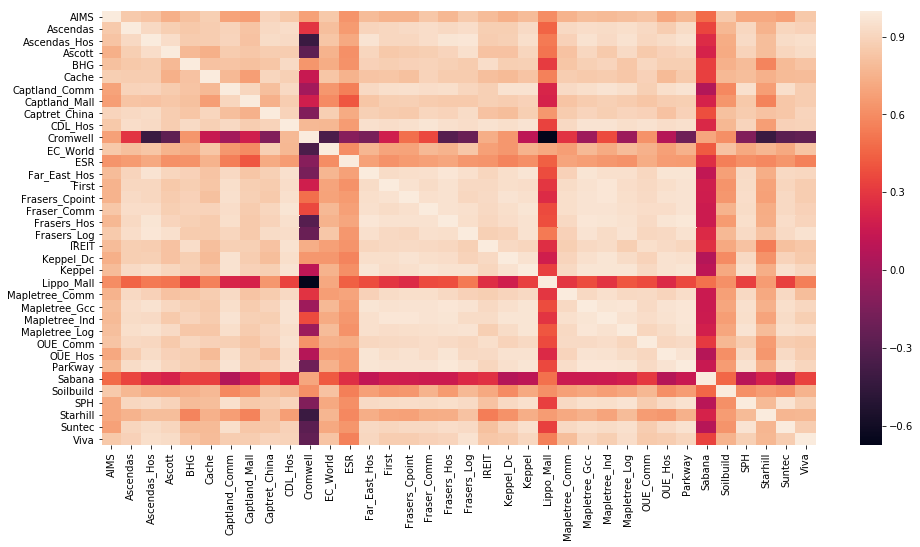

In [15]:
corr= corr_df.corr()
f, ax = plt.subplots(figsize=(16,8))
sns.heatmap(corr)

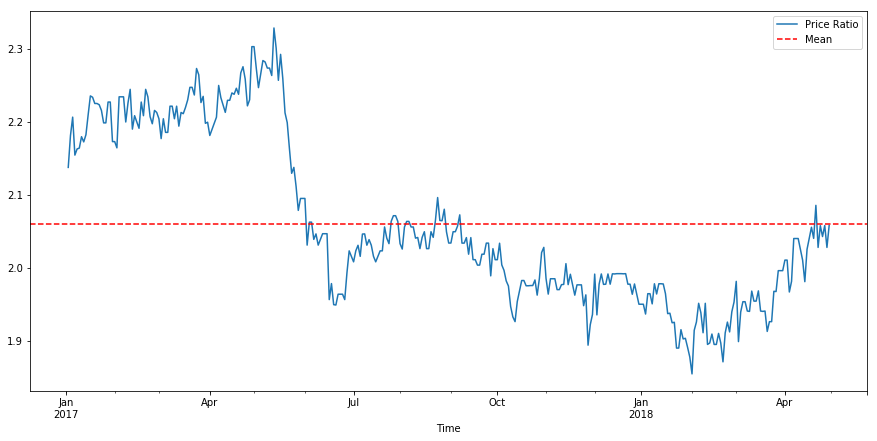

In [27]:
# Going to try pair trading from First and Far_East_Hos
Y = corr_df['First'].dropna()
X = corr_df['Far_East_Hos'].dropna()

(Y/X).plot(figsize=(15,7)) 
plt.axhline((Y/X).mean(), color='red', linestyle='--') 
plt.xlabel('Time')
plt.legend(['Price Ratio', 'Mean'])
plt.show()

In [30]:
from statsmodels.tsa.stattools import coint
score, pvalue, _ = coint(X,Y)

print(pvalue)

0.09313784867950281


In [14]:
from collections import OrderedDict

# Set the top percentile of stocks to be included in our portfolio 
n = 0.2

# Start date and end date of backtest
bt_start_date = '2009-12-31'
bt_end_date = '2018-04-30'

# Set the lookback_period to calculate the past returns
lookback_period = [(12, 2) , (12, 7), (6, 2)]

# Create lists to store our raw_data
raw_datas_names = ['MOM 12-2', 'MOM 12-7', 'MOM 6-2']
raw_datas = []

# Loop through all the variation that we want to test
for i, j in lookback_period:
    reits_returns = lookback_returns(reits_standardized, i, j)
    top_p_rank_returns = top_percentile_rank_returns(reits_returns, n)
    reits = create_signal(reits_standardized, top_p_rank_returns)
    adj_reits = adj_yahoo_data(reits)
    reits_backtest_data = adjust_backtest_dates(adj_reits, bt_start_date, bt_end_date)
    raw_datas.append(reits_backtest_data)
    
# Create an ordered dictionary storing all our processed data
full_raw_dict = OrderedDict(zip(raw_datas_names, raw_datas))

In [15]:
# Adjust the index for splits and dividends accordingly
adj_index = adj_yahoo_data(index_standardized)
index_backtest_data = adjust_backtest_dates(adj_index, bt_start_date, bt_end_date)

In [16]:
# Create a custom extended PandasData feed 
class CustomDataLoader(bt.feeds.PandasData):
    lines = ('signal',)
    params = (('signal', -1), # Set the expected position of the column 'Signal'
             )
    
    datafields = bt.feeds.PandasData.datafields + (['Signal'])

In [55]:
# Define our Momentum Strategy 
class MomentumStrategy(bt.Strategy):
    params = (('period', 1), 
             ('positions', 1),
             )

    def log(self, txt, dt=None):
        ''' Logging function for this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # To keep track of pending orders and buy price/commission
        self.order = None
        
    def notify_order(self, order):
        if order.status == order.Completed:
            n = order.info.name
            size = order.size
            if order.isbuy():
                self.log('Buy ' + str(size) + ' ' + str(n))
                
            else:
                self.log('Sell ' + str(-size) + ' ' + str(n))
        
        elif order.status == order.Rejected:
            self.log('Order is rejected')

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))

    def start(self):
        self.order = None
    
    def next(self):

        #start of backtesting period
        b_test_start = '12/31/2009'
        
        # end of backtesting period
        b_test_end = '4/1/2018'
        
        # End of the business month for Singapore timezone to rebalance 
        # our portfolio (vary from 1Q, 2Q, 4Q)
        end_date_range = pd.date_range(b_test_start, b_test_end, 
                                   freq='BM', tz='Asia/Singapore')[::self.p.period]
    
        # We will be rebalancing our portfolio every month 
        if self.datas[0].datetime.date(0) in end_date_range:
            # Simply log the closing price of the series from the reference
            self.log('Close ' + '%.2f '*len(self.datas) % (tuple(self.datas[i].close[0]
                                                            for i in range(len(self.datas)))))
            
            # log the positions
            self.log('Current Positions: '+ '%d '*len(self.datas) % tuple([self.getposition(self.datas[i]).size 
                                          for i in range(len(self.datas))]))
            
            # list of stocks to buy 
            target_buy = [i for i in range(len(self.datas)) if self.datas[i].signal[1] > 0]
            
            # Log the number of stocks to be bought
            self.p.positions = len(target_buy)
            
            # list of stocks to sell
            target_sale = [i for i in range(len(self.datas)) if i not in target_buy]                                    
            
            for j in target_sale:
                # if there is an existing position, sell the stock
                if self.getposition(self.datas[j]).size > 0:
                    self.order = self.order_target_size(target=0, 
                                                        data=self.datas[j])
                    if self.order is not None:
                        self.order.addinfo(name=self.datas[j]._name)
                        
            for i in target_buy:
                # buy the stock according to the number of stocks in our target_buy list
                self.order = self.order_target_percent(target=np.round(0.97/self.p.positions, 2), 
                                                          data=self.datas[i],
                                                      price=self.datas[i].high[1],
                                                       exectype=bt.Order.Limit)
                if self.order is not None:
                    self.order.addinfo(name=self.datas[i]._name)

Starting Portfolio Value: 100000.00
Currently testing strategy MOM 12-2
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 100780 Starhill
2010-01-01, Buy 61436 AIMS
2010-01-01, Buy 71050 Fraser_Comm
2010-01-29, Close 0.62 0.45 0.00 0.00 0.00 0.84 0.00 0.32 0.27 0.00 0.00 0.53 0.73 0.47 0.00 1.10 0.64 0.00 0.00 0.00 1.16 0.00 0.88 0.00 0.35 0.00 0.61 0.00 0.24 0.00 0.00 0.00 0.00 0.00 1.02 0.80 
2010-01-29, Current Positions: 0 0 0 0 0 0 0 100780 0 0 0 61436 0 71050 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-02-01, Sell 100780 Starhill
2010-02-01, Buy 171 AIMS
2010-02-01, Sell 520 Fraser_Comm
2010-02-01, Buy 29237 Captland_Mall
2010-02-01, OPERATION PROFIT, GROSS 1219.03, NET 1141.50
2010-02-26, Close 0.60 0.45 0.00

2012-08-31, Close 0.81 0.77 0.00 0.78 0.00 1.29 0.00 0.52 0.29 0.00 0.00 0.81 1.03 0.78 0.94 1.46 0.99 0.67 0.53 0.00 1.66 0.00 1.49 0.00 0.70 0.00 0.81 0.59 0.41 0.00 0.69 0.00 0.00 0.00 1.37 1.07 
2012-08-31, Current Positions: 0 0 0 0 0 0 0 0 138317 0 0 0 0 0 0 0 40065 0 0 0 0 0 0 0 0 0 46610 0 0 0 0 0 0 0 0 35227 
2012-09-03, Sell 40065 Captland_Comm
2012-09-03, Sell 35227 Suntec
2012-09-03, Sell 4447 Lippo_Mall
2012-09-03, Buy 26526 Captland_Mall
2012-09-03, Buy 25506 Parkway
2012-09-03, Buy 1082 Keppel
2012-09-03, OPERATION PROFIT, GROSS 9072.10, NET 8975.57
2012-09-03, OPERATION PROFIT, GROSS 9835.20, NET 9750.32
2012-09-28, Close 0.81 0.78 0.00 0.83 0.00 1.31 0.00 0.54 0.30 0.00 0.00 0.87 1.06 0.82 0.98 1.49 1.05 0.75 0.58 0.00 1.70 0.00 1.54 0.00 0.74 0.00 0.86 0.60 0.42 0.00 0.73 0.00 0.00 0.00 1.37 1.10 
2012-09-28, Current Positions: 0 0 0 0 0 0 0 0 133870 0 0 0 0 0 0 26526 0 0 0 0 0 0 25506 0 0 0 47692 0 0 0 0 0 0 0 0 0 
2012-10-01, Sell 47692 Keppel
2012-10-01, Sell 817 L

2014-12-31, Current Positions: 0 0 0 0 0 0 0 0 99198 0 0 0 0 0 0 17223 0 0 47110 0 0 0 0 0 0 0 0 52737 53153 0 42578 0 0 0 0 0 
2015-01-01, Sell 17223 Captland_Mall
2015-01-01, Buy 4787 Lippo_Mall
2015-01-01, Buy 355 Sabana
2015-01-01, Buy 13655 Parkway
2015-01-01, Sell 214 Ascendas_Hos
2015-01-01, Sell 216 ESR
2015-01-01, Sell 21 Far_East_Hos
2015-01-01, OPERATION PROFIT, GROSS 724.97, NET 644.54
2015-01-30, Close 1.01 0.97 0.85 1.24 0.79 1.72 0.00 0.67 0.28 0.59 0.00 1.10 1.41 1.21 1.26 1.75 1.41 0.84 0.58 0.00 1.98 0.62 2.07 0.57 1.07 0.61 1.03 0.53 0.53 0.88 0.67 0.00 0.59 0.66 1.39 1.58 
2015-01-30, Current Positions: 0 0 0 0 0 0 0 0 103985 0 0 0 0 0 0 0 0 0 47465 0 0 0 13655 0 0 0 0 52523 52937 0 42557 0 0 0 0 0 
2015-02-02, Sell 42557 Far_East_Hos
2015-02-02, Sell 2446 Lippo_Mall
2015-02-02, Buy 47726 OUE_Comm
2015-02-02, Buy 1121 Sabana
2015-02-02, Sell 23 Parkway
2015-02-02, Buy 606 Ascendas_Hos
2015-02-02, Buy 40 ESR
2015-02-02, OPERATION PROFIT, GROSS 1429.01, NET 1341.01
20

2017-03-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 12942 0 0 60313 0 0 0 0 0 0 0 0 34872 0 0 43365 36125 40895 37836 0 0 
2017-04-03, Sell 34872 Ascendas_Hos
2017-04-03, Buy 35503 Starhill
2017-04-03, Buy 746 Captland_Mall
2017-04-03, Sell 5264 Sabana
2017-04-03, Buy 1718 Far_East_Hos
2017-04-03, Sell 1821 BHG
2017-04-03, Buy 450 Soilbuild
2017-04-03, Buy 780 Frasers_Hos
2017-04-03, OPERATION PROFIT, GROSS 1249.37, NET 1191.83
2017-04-28, Close 1.05 1.04 1.17 1.49 0.95 1.97 0.92 0.71 0.40 0.67 0.72 1.25 1.54 1.27 1.71 1.87 1.47 0.77 0.41 0.00 2.40 0.66 2.42 0.69 1.29 0.74 1.02 0.71 0.53 0.93 0.56 0.71 0.61 0.67 1.43 1.66 
2017-04-28, Current Positions: 0 0 0 0 0 0 0 35503 0 0 0 0 0 0 0 13688 0 0 55049 0 0 0 0 0 0 0 0 0 0 0 45083 34304 41345 38616 0 0 
2017-05-01, Sell 584 Starhill
2017-05-01, Sell 316 Captland_Mall
2017-05-01, Buy 5089 Sabana
2017-05-01, Sell 414 Far_East_Hos
2017-05-01, Buy 889 BHG
2017-05-01, Sell 704 Soilbuild
2017-05-01, Sell 1433 Frasers_Hos
2017-05-31, 

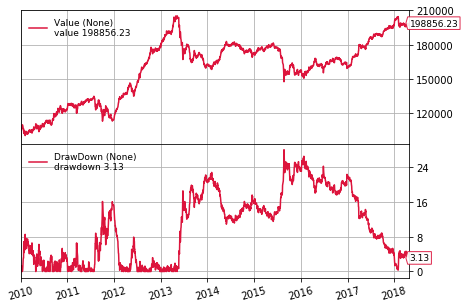

Sharpe Ratio:  0.7344391086526094
SQN:  2.726246959802334
Final Portfolio Value: 198856.23


Starting Portfolio Value: 100000.00
Currently testing strategy MOM 12-7
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 71050 Fraser_Comm
2010-01-01, Buy 27456 Captland_Mall
2010-01-01, Buy 32546 CDL_Hos
2010-01-29, Close 0.62 0.45 0.00 0.00 0.00 0.84 0.00 0.32 0.27 0.00 0.00 0.53 0.73 0.47 0.00 1.10 0.64 0.00 0.00 0.00 1.16 0.00 0.88 0.00 0.35 0.00 0.61 0.00 0.24 0.00 0.00 0.00 0.00 0.00 1.02 0.80 
2010-01-29, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 71050 0 27456 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 32546 0 
2010-02-01, Sell 71050 Fraser_Comm
2010-02-01, Sell 32546 CDL_Hos
2010-02-01, Buy 1723 Captland_Mall
2010-02-01, Buy 

2012-07-02, Sell 1110 Keppel
2012-07-02, Buy 34958 Suntec
2012-07-02, OPERATION PROFIT, GROSS 4351.83, NET 4272.02
2012-07-31, Close 0.76 0.70 0.00 0.76 0.00 1.30 0.00 0.51 0.27 0.00 0.00 0.80 1.00 0.76 0.90 1.45 0.94 0.66 0.51 0.00 1.60 0.00 1.50 0.00 0.67 0.00 0.81 0.58 0.39 0.00 0.00 0.00 0.00 0.00 1.35 1.07 
2012-07-31, Current Positions: 0 0 0 0 0 0 0 0 132449 0 0 0 0 0 0 0 40283 0 0 0 0 0 0 0 0 0 46379 0 0 0 0 0 0 0 0 34958 
2012-08-01, Buy 3909 Lippo_Mall
2012-08-01, Sell 786 Captland_Comm
2012-08-01, Sell 430 Keppel
2012-08-01, Sell 236 Suntec
2012-08-31, Close 0.81 0.77 0.00 0.78 0.00 1.29 0.00 0.52 0.29 0.00 0.00 0.81 1.03 0.78 0.94 1.46 0.99 0.67 0.53 0.00 1.66 0.00 1.49 0.00 0.70 0.00 0.81 0.59 0.41 0.00 0.69 0.00 0.00 0.00 1.37 1.07 
2012-08-31, Current Positions: 0 0 0 0 0 0 0 0 136358 0 0 0 0 0 0 0 39497 0 0 0 0 0 0 0 0 0 45949 0 0 0 0 0 0 0 0 34722 
2012-09-03, Sell 39497 Captland_Comm
2012-09-03, Sell 4391 Lippo_Mall
2012-09-03, Buy 25143 Parkway
2012-09-03, Buy 1065 K

2014-11-03, Sell 66172 Ascendas_Hos
2014-11-03, Sell 55727 Far_East_Hos
2014-11-03, Buy 37769 Ascott
2014-11-03, Sell 3146 Mapletree_Gcc
2014-11-03, Buy 9049 Lippo_Mall
2014-11-03, Buy 32634 AIMS
2014-11-03, Buy 57997 Sabana
2014-11-03, OPERATION PROFIT, GROSS -361.24, NET -449.80
2014-11-03, OPERATION PROFIT, GROSS -743.22, NET -827.94
2014-11-03, OPERATION PROFIT, GROSS 3008.11, NET 2921.27
2014-11-28, Close 0.98 0.94 0.00 1.14 0.76 1.56 0.00 0.65 0.29 0.57 0.00 1.09 1.31 1.18 1.22 1.64 1.31 0.83 0.60 0.00 1.89 0.59 2.00 0.59 1.00 0.60 1.03 0.53 0.53 0.87 0.66 0.00 0.59 0.65 1.34 1.63 
2014-11-28, Current Positions: 37769 0 0 0 49427 0 0 0 128464 0 0 32634 0 0 0 0 0 0 57997 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2014-12-01, Sell 37769 Ascott
2014-12-01, Sell 9156 Mapletree_Gcc
2014-12-01, Sell 21127 Lippo_Mall
2014-12-01, Sell 4504 AIMS
2014-12-01, Sell 7024 Sabana
2014-12-01, Buy 50743 Viva
2014-12-01, Buy 57062 Ascendas_Hos
2014-12-01, OPERATION PROFIT, GROSS 1015.23, NET 927.66
2014-1

2016-11-30, Close 1.00 0.92 1.13 1.33 0.86 1.80 0.83 0.69 0.35 0.61 0.68 1.14 1.30 1.17 1.52 1.79 1.34 0.69 0.40 0.00 2.15 0.59 2.30 0.64 1.17 0.67 1.00 0.63 0.48 0.88 0.53 0.60 0.56 0.58 1.17 1.57 
2016-11-30, Current Positions: 31497 0 0 0 0 0 0 0 0 0 0 0 0 25335 0 0 0 45032 79980 0 0 0 0 0 0 0 0 0 63636 0 0 0 53123 0 0 0 
2016-12-01, Sell 31497 Ascott
2016-12-01, Sell 25335 Fraser_Comm
2016-12-01, Sell 317 Cache
2016-12-01, Sell 2811 Sabana
2016-12-01, Buy 14194 Ascendas
2016-12-01, Buy 51928 OUE_Hos
2016-12-01, Buy 675 ESR
2016-12-01, Buy 1465 Soilbuild
2016-12-01, OPERATION PROFIT, GROSS 137.11, NET 61.10
2016-12-01, OPERATION PROFIT, GROSS -1974.33, NET -2047.78
2016-12-30, Close 1.00 0.92 1.09 1.28 0.84 1.75 0.84 0.68 0.34 0.62 0.70 1.15 1.29 1.16 1.53 1.73 1.30 0.68 0.34 0.00 2.08 0.60 2.21 0.64 1.17 0.68 0.96 0.64 0.48 0.87 0.55 0.65 0.56 0.60 1.18 1.53 
2016-12-30, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 44715 77169 0 14194 51928 0 0 0 0 0 0 64311 0 0 0 54588 0 0

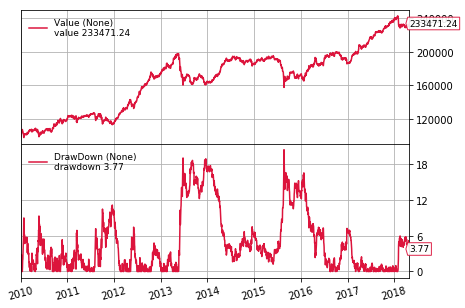

Sharpe Ratio:  0.9099323507197343
SQN:  3.8344264815750484
Final Portfolio Value: 233471.24


Starting Portfolio Value: 100000.00
Currently testing strategy MOM 6-2
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 100780 Starhill
2010-01-01, Buy 61436 AIMS
2010-01-01, Buy 41175 Captret_China
2010-01-29, Close 0.62 0.45 0.00 0.00 0.00 0.84 0.00 0.32 0.27 0.00 0.00 0.53 0.73 0.47 0.00 1.10 0.64 0.00 0.00 0.00 1.16 0.00 0.88 0.00 0.35 0.00 0.61 0.00 0.24 0.00 0.00 0.00 0.00 0.00 1.02 0.80 
2010-01-29, Current Positions: 0 0 0 0 0 0 0 100780 0 0 0 61436 41175 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-02-01, Sell 100780 Starhill
2010-02-01, Sell 1691 AIMS
2010-02-01, Buy 2451 Captret_China
2010-02-01, Buy 66175 Fras

2012-04-02, OPERATION PROFIT, GROSS 3117.48, NET 3046.66
2012-04-30, Close 0.70 0.66 0.00 0.63 0.00 1.14 0.00 0.45 0.26 0.00 0.00 0.72 0.90 0.64 0.77 1.31 0.88 0.61 0.47 0.00 1.44 0.00 1.40 0.00 0.62 0.00 0.70 0.00 0.35 0.00 0.00 0.00 0.00 0.00 1.24 0.95 
2012-04-30, Current Positions: 0 0 0 0 0 0 0 0 118406 0 0 0 0 0 0 23515 0 0 0 0 0 0 22528 0 0 0 45565 0 0 0 0 0 0 0 0 0 
2012-05-01, Sell 22528 Parkway
2012-05-01, Sell 45565 Keppel
2012-05-01, Buy 794 Lippo_Mall
2012-05-01, Buy 40855 Mapletree_Ind
2012-05-01, Buy 420 Captland_Mall
2012-05-01, Buy 21821 Ascendas
2012-05-01, OPERATION PROFIT, GROSS 1022.47, NET 948.04
2012-05-01, OPERATION PROFIT, GROSS 3370.87, NET 3296.23
2012-05-31, Close 0.65 0.66 0.00 0.64 0.00 1.16 0.00 0.44 0.24 0.00 0.00 0.69 0.87 0.66 0.78 1.32 0.84 0.61 0.47 0.00 1.43 0.00 1.39 0.00 0.61 0.00 0.69 0.00 0.35 0.00 0.00 0.00 0.00 0.00 1.20 0.93 
2012-05-31, Current Positions: 0 0 0 0 0 0 0 0 119200 0 0 0 0 0 40855 23935 0 0 0 0 21821 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

2014-06-02, Sell 4920 AIMS
2014-06-02, Buy 41681 Sabana
2014-06-02, Buy 46827 Viva
2014-06-02, Buy 46705 Ascendas_Hos
2014-06-02, OPERATION PROFIT, GROSS 1669.97, NET 1596.55
2014-06-02, OPERATION PROFIT, GROSS 2011.00, NET 1933.90
2014-06-30, Close 0.91 0.90 0.00 1.08 0.65 1.53 0.00 0.65 0.30 0.55 0.00 1.04 1.18 1.06 1.12 1.59 1.29 0.81 0.62 0.00 1.80 0.54 1.97 0.00 0.93 0.57 1.03 0.56 0.58 0.82 0.67 0.00 0.57 0.00 1.32 1.47 
2014-06-30, Current Positions: 0 0 0 0 39610 0 0 0 87805 0 0 25246 0 0 0 0 0 0 41681 0 0 0 0 0 0 46827 0 46705 0 0 0 0 0 0 0 0 
2014-07-01, Sell 39610 Mapletree_Gcc
2014-07-01, Sell 25246 AIMS
2014-07-01, Sell 46705 Ascendas_Hos
2014-07-01, Buy 28327 Ascott
2014-07-01, Sell 48 Lippo_Mall
2014-07-01, Buy 334 Sabana
2014-07-01, Buy 13213 Parkway
2014-07-01, Sell 1092 Viva
2014-07-01, Buy 31711 SPH
2014-07-01, OPERATION PROFIT, GROSS 3079.39, NET 3006.94
2014-07-01, OPERATION PROFIT, GROSS 2652.20, NET 2579.91
2014-07-01, OPERATION PROFIT, GROSS -174.85, NET -238.01

2016-06-01, Sell 505 ESR
2016-06-01, Sell 581 Soilbuild
2016-06-01, OPERATION PROFIT, GROSS -832.44, NET -890.16
2016-06-30, Close 0.94 0.87 0.98 1.30 0.87 1.91 0.86 0.70 0.31 0.58 0.00 1.18 1.36 1.13 1.54 1.91 1.26 0.69 0.38 0.00 2.20 0.60 2.21 0.62 1.12 0.61 0.95 0.59 0.47 0.83 0.54 0.73 0.57 0.65 1.20 1.59 
2016-06-30, Current Positions: 24690 0 0 0 0 0 0 0 0 42643 0 0 0 0 0 0 0 35078 56192 0 0 0 0 0 0 0 0 0 53086 0 0 0 41419 0 0 0 
2016-07-01, Sell 24690 Ascott
2016-07-01, Sell 42643 OUE_Comm
2016-07-01, Sell 5005 Cache
2016-07-01, Sell 1084 Sabana
2016-07-01, Buy 35130 Ascendas_Hos
2016-07-01, Sell 9079 ESR
2016-07-01, Buy 38394 Far_East_Hos
2016-07-01, Buy 28774 BHG
2016-07-01, Sell 5081 Soilbuild
2016-07-01, OPERATION PROFIT, GROSS -747.23, NET -804.96
2016-07-01, OPERATION PROFIT, GROSS 183.95, NET 125.00
2016-07-29, Close 1.00 0.93 1.10 1.40 0.92 1.94 0.90 0.71 0.33 0.59 0.74 1.24 1.38 1.21 1.62 1.94 1.32 0.71 0.39 0.00 2.17 0.64 2.33 0.64 1.18 0.65 0.98 0.65 0.48 0.88 0.56 0.

2018-02-01, Sell 33643 EC_World
2018-02-01, Sell 47230 ESR
2018-02-01, Sell 1121 Lippo_Mall
2018-02-01, Buy 35817 OUE_Comm
2018-02-01, Buy 606 AIMS
2018-02-01, Buy 15790 Captret_China
2018-02-01, Buy 1241 Sabana
2018-02-01, Sell 275 BHG
2018-02-01, Buy 157 Soilbuild
2018-02-01, OPERATION PROFIT, GROSS 679.38, NET 616.41
2018-02-01, OPERATION PROFIT, GROSS 2008.97, NET 1945.51
2018-02-28, Close 1.17 1.17 1.37 1.55 1.13 2.18 1.05 0.72 0.39 0.70 0.75 1.35 1.60 1.42 1.93 1.99 1.70 0.82 0.39 0.57 2.58 0.85 2.79 0.78 1.35 0.85 1.17 0.82 0.56 0.99 0.69 0.76 0.63 0.77 1.66 1.96 
2018-02-28, Current Positions: 0 0 0 0 0 0 0 0 64203 35817 0 19704 15790 0 0 0 0 0 67872 0 0 0 0 0 0 0 0 0 0 0 0 34595 39888 0 0 0 
2018-03-01, Sell 35817 OUE_Comm
2018-03-01, Sell 15790 Captret_China
2018-03-01, Buy 1676 Lippo_Mall
2018-03-01, Buy 33484 EC_World
2018-03-01, Sell 547 AIMS
2018-03-01, Buy 12936 Captland_Mall
2018-03-01, Sell 1219 Sabana
2018-03-01, Sell 806 BHG
2018-03-01, Buy 883 Soilbuild
2018-03-01, 

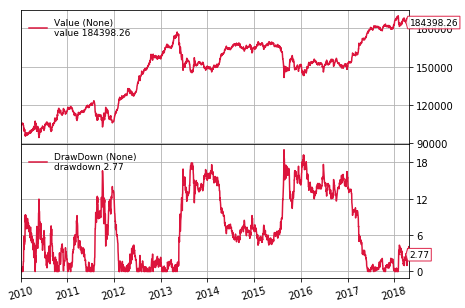

Sharpe Ratio:  0.6747825104464709
SQN:  3.384222090164087
Final Portfolio Value: 184398.26




In [210]:
full_returns_dict = {}
full_values_dict = OrderedDict()

if __name__ == '__main__':
    
    for i in full_raw_dict.keys():
        
        # Create a cerebro entity
        cerebro = bt.Cerebro(stdstats=False)
        
        # Add the datafeeds into cerebro
        for key in full_raw_dict[i].keys():
            data = CustomDataLoader(dataname=full_raw_dict[i][key])
            data.plotinfo.plot = False
            cerebro.adddata(data, name=key)
    
        # Add a strategy and define our holding period
        cerebro.addstrategy(MomentumStrategy, period=1)
    
        # Set our desired cash start
        cerebro.broker.setcash(100000.0)
    
        # Set the commission
        cerebro.broker.setcommission(commission=0.0012)
        cerebro.broker.set_checksubmit(False)

        # Add analyzers to cerebro
        #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
        cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.0, timeframe=bt.TimeFrame.Days)
        cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
        cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
        # Add observers to cerebro
        cerebro.addobserver(bt.observers.Value)
        cerebro.addobserver(bt.observers.DrawDown)

        # Print out the starting conditions
        print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
        print('Currently testing strategy ' + str(i))
    
        # Run over everything
        strategies = cerebro.run()
        firstStrat = strategies[0]
    
        # Plot everything
        fig = cerebro.plot()
    
        # Print the analyzers
        #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
        print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
        print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
        # Get the pyfolio data and store it into a dictionary
        pyfoliozer = firstStrat.analyzers.pyfolio
        returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
        full_returns_dict[str(i)] = returns
        full_values_dict[str(i)] = cerebro.broker.getvalue()
    
        # Print out the final result
        print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
        print('\n')


Let's store the results of our backtest accordingly:

In [211]:
full_returns_dict_1M = full_returns_dict.copy()

In [209]:
full_returns_dict_3M = full_returns_dict.copy()

In [207]:
full_returns_dict_6M = full_returns_dict.copy()

In [205]:
full_returns_dict_9M = full_returns_dict.copy()

In [201]:
full_returns_dict_12M = full_returns_dict.copy()

Now that we have ran our backtest, let's process our data into a format that can be fed into pyfolio. After which, we will be able to generate beautiful looking return tearsheets!

## General Test Parameters:
- Backtesting period: 1/1/2009 to 30/4/2018
- Number of reits included in our portfolio: Top 20%
- Comission cost: 0.12%
- Risk free rate: 0.00%

To benchmark our performane, we will be comparing it with our simple self-made index, comprising of an equal weighted portfolio of the 6 largest reits listed since 2010.

In [18]:
# Create a copy of STI returns
STI = index_backtest_data['STI'].copy()

# Calculate the returns
sti_rets = STI['Close'].pct_change().fillna(0)
sti_rets.index = sti_rets.index.tz_localize('utc')

In [19]:
# Our self-constructed REITS index
data1 = reits_standardized['Captland_Mall']['Adj Close'].pct_change()
data2 = reits_standardized['Ascendas']['Adj Close'].pct_change()
data3 = reits_standardized['Captland_Comm']['Adj Close'].pct_change()
data4 = reits_standardized['Suntec']['Adj Close'].pct_change()
data5 = reits_standardized['Keppel']['Adj Close'].pct_change()
data6 = reits_standardized['Starhill']['Adj Close'].pct_change()

new_index_raw = 0.16* (data1 + data2 + data3 + data4 + data5 + data6)
new_index_raw = new_index_raw['2009-12-31':'2018-04-30']
new_index_raw.name = '6 largest Reits'
new_index_raw.index = new_index_raw.index.tz_localize('utc')

### Test 1:
- Criteria: MOM 12-2 cumulative returns
- Holding period: 1/3/6/9/12 months


#### MOM 12-2 with 1 month holding period

Backtest months: 103


,Backtest
Annual return,8.3%
Cumulative returns,98.9%
Annual volatility,11.8%
Sharpe ratio,0.73
Calmar ratio,0.30
Stability,0.62
Max drawdown,-28.1%
Omega ratio,1.14
Sortino ratio,1.04
Skew,-0.34


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,28.09,2013-05-09,2015-08-24,NaT,NaN
1,16.15,2011-07-28,2011-10-04,2012-03-02,157
2,8.57,2010-01-14,2010-02-05,2010-04-29,76
3,7.93,2012-05-04,2012-06-04,2012-07-02,42
4,6.57,2011-02-04,2011-03-15,2011-04-14,50


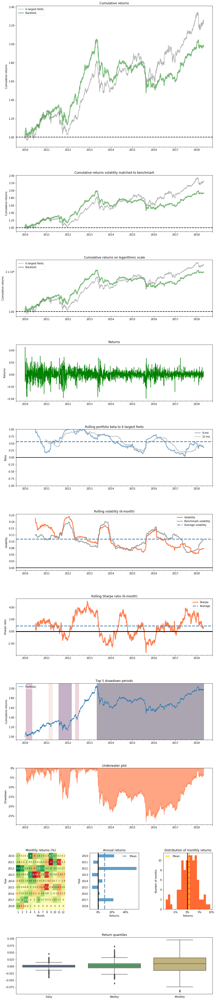

In [214]:
M12_2_1_returns = full_returns_dict_1M['MOM 12-2']
create_custom_tear_sheet(returns=M12_2_1_returns, benchmark_rets=new_index_raw)

#### MOM 12-2 with 3 months holding period

Backtest months: 103


,Backtest
Annual return,9.2%
Cumulative returns,114.2%
Annual volatility,11.7%
Sharpe ratio,0.81
Calmar ratio,0.34
Stability,0.68
Max drawdown,-26.8%
Omega ratio,1.16
Sortino ratio,1.17
Skew,-0.23


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,26.83,2013-04-29,2015-08-24,2017-12-19,1212
1,10.87,2011-08-03,2011-10-04,2012-01-30,129
2,10.04,2010-04-30,2010-05-25,2010-07-20,58
3,9.32,2010-01-14,2010-02-05,2010-04-29,76
4,7.83,2012-05-04,2012-06-04,2012-07-02,42


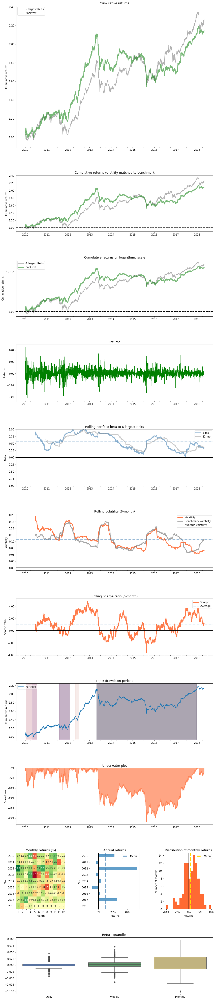

In [215]:
M12_2_3_returns = full_returns_dict_3M['MOM 12-2']
create_custom_tear_sheet(returns=M12_2_3_returns, benchmark_rets=new_index_raw)

#### MOM 12-2 with 6 months holding period

Backtest months: 103


,Backtest
Annual return,10.1%
Cumulative returns,128.8%
Annual volatility,11.6%
Sharpe ratio,0.89
Calmar ratio,0.42
Stability,0.72
Max drawdown,-23.9%
Omega ratio,1.17
Sortino ratio,1.30
Skew,-0.04


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,23.93,2013-04-29,2015-08-24,2017-07-27,1109
1,12.48,2010-04-26,2010-05-25,2010-09-17,105
2,9.51,2011-08-03,2011-10-04,2012-01-13,118
3,9.32,2010-01-14,2010-02-05,2010-04-23,72
4,8.78,2012-05-04,2012-06-04,2012-07-02,42


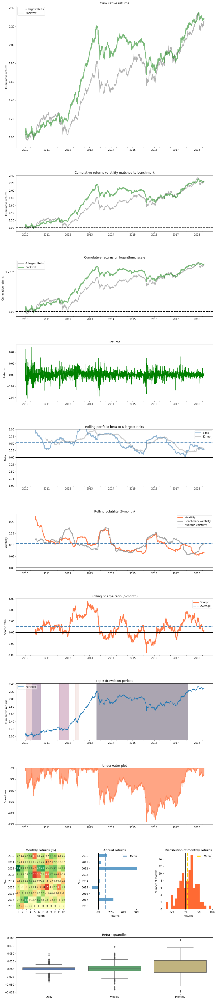

In [216]:
M12_2_6_returns = full_returns_dict_6M['MOM 12-2']
create_custom_tear_sheet(returns=M12_2_6_returns, benchmark_rets=new_index_raw)

#### MOM 12-2 with 9 months holding period

Backtest months: 103


,Backtest
Annual return,9.9%
Cumulative returns,126.3%
Annual volatility,12.0%
Sharpe ratio,0.85
Calmar ratio,0.40
Stability,0.79
Max drawdown,-24.6%
Omega ratio,1.17
Sortino ratio,1.23
Skew,-0.03


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,24.57,2013-04-29,2015-08-24,2017-06-16,1080
1,12.48,2010-04-26,2010-05-25,2010-09-17,105
2,9.83,2011-02-09,2011-03-17,2011-07-01,103
3,9.50,2011-08-03,2011-10-04,2012-01-31,130
4,9.32,2010-01-14,2010-02-05,2010-04-23,72


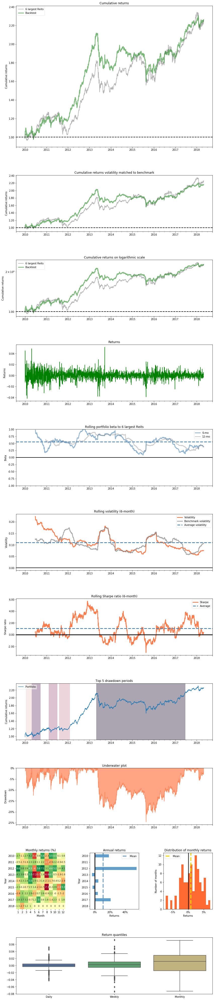

In [217]:
M12_2_9_returns = full_returns_dict_9M['MOM 12-2']
create_custom_tear_sheet(returns=M12_2_9_returns, benchmark_rets=new_index_raw)

#### MOM 12-2 with 12 months holding period

Backtest months: 103


,Backtest
Annual return,8.4%
Cumulative returns,100.9%
Annual volatility,12.5%
Sharpe ratio,0.71
Calmar ratio,0.39
Stability,0.82
Max drawdown,-21.6%
Omega ratio,1.14
Sortino ratio,1.01
Skew,-0.23


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.57,2011-08-01,2011-12-19,2012-07-11,248
1,21.32,2013-04-29,2015-08-24,2017-03-30,1024
2,12.48,2010-04-26,2010-05-25,2010-09-17,105
3,9.32,2010-01-14,2010-02-05,2010-04-23,72
4,5.48,2011-01-06,2011-03-17,2011-04-25,78


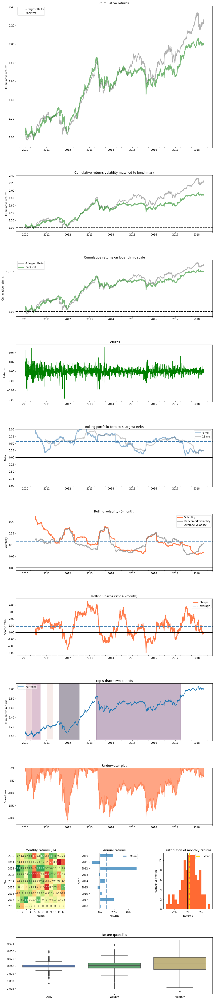

In [218]:
M12_2_12_returns = full_returns_dict_12M['MOM 12-2']
create_custom_tear_sheet(returns=M12_2_12_returns, benchmark_rets=new_index_raw)

### Test 2:
- Criteria: MOM 12-7 cumulative returns
- Holding period: 1/3/6/9/12 months

#### MOM 12-7 with 1 month holding period

Backtest months: 103


,Backtest
Annual return,10.3%
Cumulative returns,133.5%
Annual volatility,11.5%
Sharpe ratio,0.91
Calmar ratio,0.51
Stability,0.85
Max drawdown,-20.4%
Omega ratio,1.18
Sortino ratio,1.30
Skew,-0.27


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.42,2013-05-20,2015-08-24,2016-08-17,848
1,11.13,2011-07-29,2011-12-20,2012-02-22,149
2,9.31,2010-04-27,2010-05-25,2010-09-08,97
3,8.98,2010-01-14,2010-01-27,2010-03-29,53
4,7.43,2012-05-09,2012-06-04,2012-06-29,38


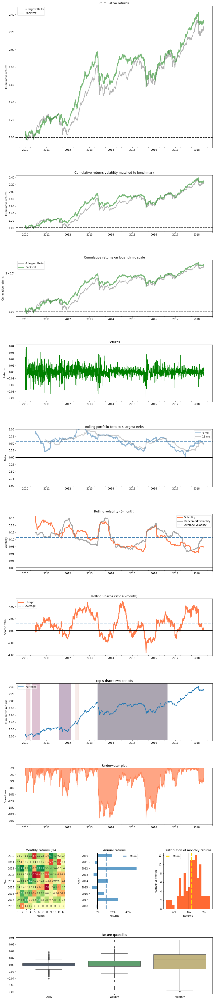

In [219]:
M12_7_1_returns = full_returns_dict_1M['MOM 12-7']
create_custom_tear_sheet(returns=M12_7_1_returns, benchmark_rets=new_index_raw)

#### MOM 12-7 with 3 months holding period 

Backtest months: 103


,Backtest
Annual return,12.0%
Cumulative returns,166.3%
Annual volatility,11.5%
Sharpe ratio,1.05
Calmar ratio,0.63
Stability,0.89
Max drawdown,-19.0%
Omega ratio,1.21
Sortino ratio,1.53
Skew,-0.20


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.00,2013-05-09,2015-08-24,2016-04-22,772
1,8.98,2010-01-14,2010-01-27,2010-05-13,86
2,8.11,2011-08-03,2011-10-04,2012-02-08,136
3,6.61,2012-05-09,2012-06-05,2012-06-29,38
4,6.51,2016-09-07,2016-12-28,2017-03-02,127


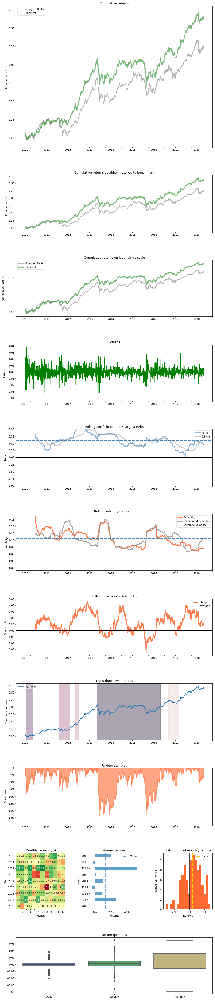

In [220]:
M12_7_3_returns = full_returns_dict_3M['MOM 12-7']
create_custom_tear_sheet(returns=M12_7_3_returns, benchmark_rets=new_index_raw)

#### MOM 12-7 with 6 months holding period 

Backtest months: 103


,Backtest
Annual return,11.1%
Cumulative returns,148.2%
Annual volatility,11.7%
Sharpe ratio,0.96
Calmar ratio,0.59
Stability,0.85
Max drawdown,-18.9%
Omega ratio,1.19
Sortino ratio,1.41
Skew,-0.09


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.90,2015-05-26,2015-08-24,2016-08-17,322
1,16.88,2013-05-20,2013-06-25,2015-05-25,526
2,10.58,2010-05-13,2010-05-25,2010-09-15,90
3,8.98,2010-01-14,2010-01-27,2010-04-26,73
4,8.19,2011-08-03,2011-12-15,2012-02-08,136


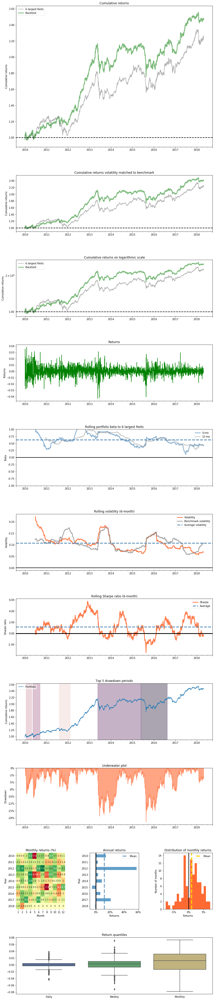

In [221]:
M12_7_6_returns = full_returns_dict_6M['MOM 12-7']
create_custom_tear_sheet(returns=M12_7_6_returns, benchmark_rets=new_index_raw)

#### MOM 12-7 with 9 months holding period 

Backtest months: 103


,Backtest
Annual return,11.9%
Cumulative returns,162.9%
Annual volatility,12.0%
Sharpe ratio,0.99
Calmar ratio,0.66
Stability,0.90
Max drawdown,-18.0%
Omega ratio,1.20
Sortino ratio,1.45
Skew,-0.04


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.00,2013-05-20,2013-12-11,2016-04-21,764
1,10.58,2010-05-13,2010-05-25,2010-07-27,54
2,9.85,2011-02-09,2011-03-17,2011-07-01,103
3,8.98,2010-01-14,2010-01-27,2010-04-26,73
4,8.15,2011-08-03,2011-12-15,2012-02-13,139


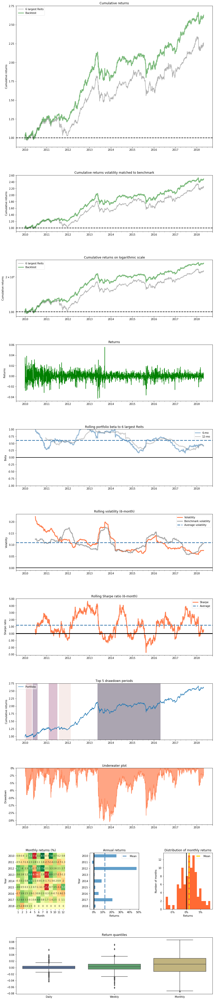

In [222]:
M12_7_9_returns = full_returns_dict_9M['MOM 12-7']
create_custom_tear_sheet(returns=M12_7_9_returns, benchmark_rets=new_index_raw)

#### MOM 12-7 with 12 months holding period 

Backtest months: 103


,Backtest
Annual return,10.0%
Cumulative returns,126.7%
Annual volatility,12.3%
Sharpe ratio,0.83
Calmar ratio,0.46
Stability,0.90
Max drawdown,-21.5%
Omega ratio,1.16
Sortino ratio,1.21
Skew,-0.16


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.51,2011-08-01,2011-12-19,2012-07-17,252
1,18.69,2013-05-20,2013-12-12,2015-01-22,439
2,12.31,2015-07-24,2016-01-26,2016-07-04,247
3,10.58,2010-05-13,2010-05-25,2010-07-27,54
4,8.98,2010-01-14,2010-01-27,2010-04-26,73


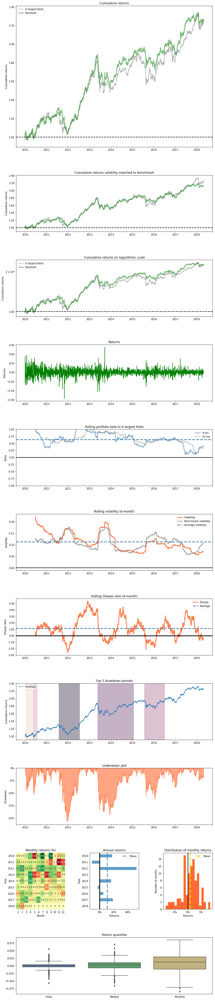

In [223]:
M12_7_12_returns = full_returns_dict_12M['MOM 12-7']
create_custom_tear_sheet(returns=M12_7_12_returns, benchmark_rets=new_index_raw)

### Test 3:
- Criteria: MOM 6-2 cumulative returns
- Holding period: 1/3/6/9/12 months

#### MOM 6-2 with 1 month holding period 

Backtest months: 103


,Backtest
Annual return,7.4%
Cumulative returns,84.4%
Annual volatility,11.5%
Sharpe ratio,0.67
Calmar ratio,0.37
Stability,0.72
Max drawdown,-20.1%
Omega ratio,1.13
Sortino ratio,0.95
Skew,-0.36


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.07,2013-05-09,2015-08-24,2017-06-12,1068
1,16.60,2011-07-28,2011-10-04,2012-02-09,141
2,11.94,2010-04-26,2010-05-25,2010-09-24,110
3,9.32,2010-01-19,2010-02-05,2010-04-23,69
4,9.21,2011-01-28,2011-03-18,2011-05-31,88


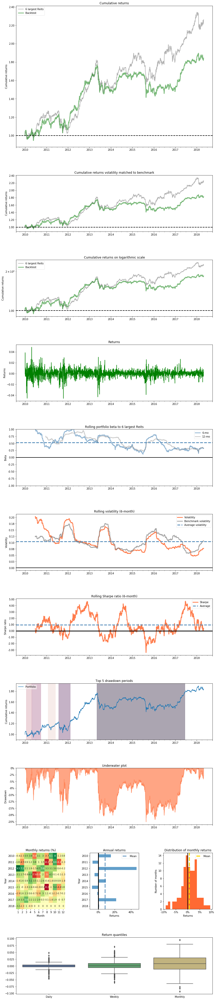

In [224]:
M6_2_1_returns = full_returns_dict_1M['MOM 6-2']
create_custom_tear_sheet(returns=M6_2_1_returns, benchmark_rets=new_index_raw)

#### MOM 6-2 with 3 months holding period 

Backtest months: 103


,Backtest
Annual return,6.2%
Cumulative returns,68.4%
Annual volatility,11.6%
Sharpe ratio,0.58
Calmar ratio,0.27
Stability,0.74
Max drawdown,-23.4%
Omega ratio,1.11
Sortino ratio,0.82
Skew,-0.26


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,23.44,2011-07-28,2011-10-04,2012-07-03,244
1,20.69,2013-04-29,2014-02-04,2017-10-09,1161
2,12.43,2010-04-26,2010-05-25,2010-10-08,120
3,7.96,2010-01-19,2010-02-24,2010-04-23,69
4,6.89,2010-11-09,2010-11-23,2011-01-06,43


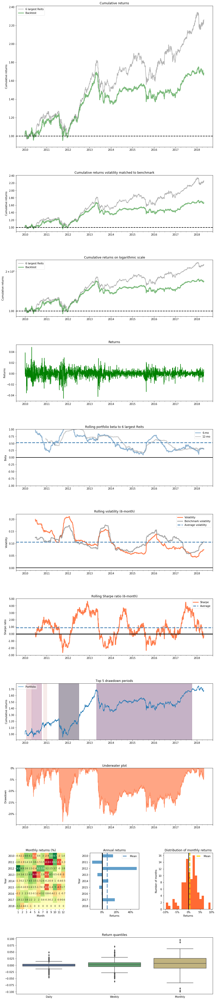

In [225]:
M6_2_3_returns = full_returns_dict_3M['MOM 6-2']
create_custom_tear_sheet(returns=M6_2_3_returns, benchmark_rets=new_index_raw)

#### MOM 6-2 with 6 months holding period 

Backtest months: 103


,Backtest
Annual return,8.0%
Cumulative returns,93.8%
Annual volatility,11.1%
Sharpe ratio,0.75
Calmar ratio,0.35
Stability,0.82
Max drawdown,-22.6%
Omega ratio,1.14
Sortino ratio,1.06
Skew,-0.35


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,22.62,2011-07-28,2011-10-04,2012-05-04,202
1,19.93,2013-04-29,2013-09-05,2017-04-26,1043
2,12.40,2010-04-29,2010-05-25,2010-08-19,81
3,8.80,2012-05-04,2012-06-04,2012-07-02,42
4,7.96,2010-01-19,2010-02-24,2010-04-14,62


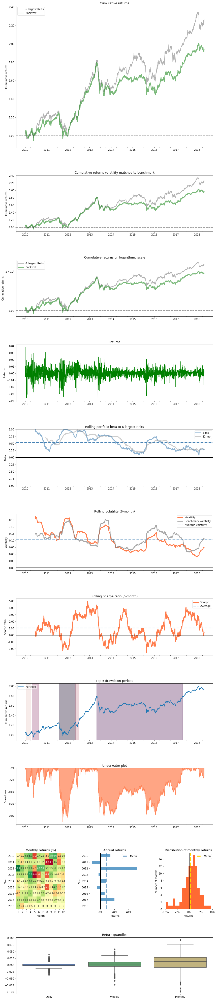

In [226]:
M6_2_6_returns = full_returns_dict_6M['MOM 6-2']
create_custom_tear_sheet(returns=M6_2_6_returns, benchmark_rets=new_index_raw)

#### MOM 6-2 with 9 months holding period 

Backtest months: 103


,Backtest
Annual return,8.1%
Cumulative returns,95.1%
Annual volatility,11.8%
Sharpe ratio,0.72
Calmar ratio,0.35
Stability,0.84
Max drawdown,-22.8%
Omega ratio,1.14
Sortino ratio,1.01
Skew,-0.38


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,22.76,2013-04-29,2015-08-24,2017-03-28,1022
1,22.65,2011-07-28,2011-10-04,2012-07-11,250
2,12.40,2010-04-29,2010-05-25,2010-09-08,95
3,8.56,2011-01-06,2011-03-17,2011-06-23,121
4,7.96,2010-01-19,2010-02-24,2010-04-14,62


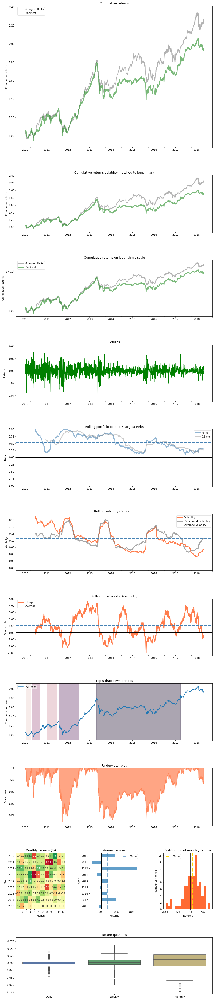

In [227]:
M6_2_9_returns = full_returns_dict_9M['MOM 6-2']
create_custom_tear_sheet(returns=M6_2_9_returns, benchmark_rets=new_index_raw)

#### MOM 6-2 with 12 months holding period 

Backtest months: 103


,Backtest
Annual return,8.3%
Cumulative returns,99.2%
Annual volatility,11.4%
Sharpe ratio,0.76
Calmar ratio,0.31
Stability,0.79
Max drawdown,-26.8%
Omega ratio,1.15
Sortino ratio,1.06
Skew,-0.51


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,26.80,2013-04-29,2015-08-24,2017-06-27,1087
1,17.00,2011-08-01,2011-12-19,2012-04-04,178
2,12.40,2010-04-29,2010-05-25,2010-09-08,95
3,8.79,2012-05-04,2012-06-04,2012-07-03,43
4,7.96,2010-01-19,2010-02-24,2010-04-14,62


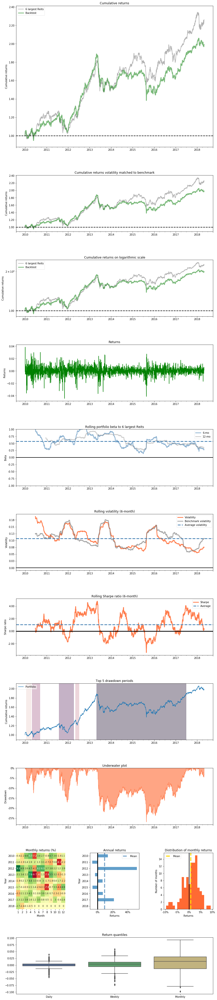

In [228]:
M6_2_12_returns = full_returns_dict_12M['MOM 6-2']
create_custom_tear_sheet(returns=M6_2_12_returns, benchmark_rets=new_index_raw)

## Time Series Momentum

The idea of time-series momentum is different from cross-sectional momentum. For time-series momentum, we are only concerned about the momentum of the stock's own price. We will be backtesting a simple iterations of this strategy:
- Rank stocks according to their lagged excess 12 months return and invest equally in those that have a positive return 

For both strategies, we will test our holding periods of 1 month, 3 months, 6 months, 9 months and 12 months.

In [20]:
filename = r'C:\Users\Law Wen Yu\Desktop\Dual_Momentum_Backtest\data\SGS_M.csv'
SGS = pd.read_csv(filename)

In [21]:
# Read the SGS 1-Year Tbill rate to calculate the excess return
SGS['Date'] = pd.DatetimeIndex(SGS['Date'])
SGS.set_index('Date', inplace=True)
SGS = SGS.loc['2009-12-31':'2018-04-30']

Now, we will create a new function called to calculate the excess lookback returns by modifying our existing lookback returns function.

In [22]:
def excess_lookback_returns(raw_dict, risk_free, n, m, col='Adj Close'):
    # Pass in a raw dictionary and specify the lookback_period in months. This
    # function will calculate the M(lookback_period) - 12 cumulative returns
    # and return it in a dataframe with the same dimensions

    # Create a new dictionary
    d = {}
    
    # Create a empty dataframe to store all the returns
    adj_returns = pd.DataFrame()
    
    # Resampling our daily data into monthly timeframe (end of month)
    for key in raw_dict.keys():
        d[key] = raw_dict[key].resample('M').last()
        # Create a new column for the risk free rate (1Y SGS T-bill)
        d[key]['Rf'] = risk_free * 0.01

        # Caculate the n lookback monthly returns using Adjusted Close (note returns 
        # are calculated using end of month data)
        adj_returns[key] = ((d[key][col].shift(m-1) / d[key][col].shift(n)) - 1) - d[key]['Rf']
    
    return adj_returns

Now, we will be calculating the excess lagged 12 returns of the reit. If it is positive, we will include it into our portfolio. If it is negative, we will leave it out of our portfolio. 

In [23]:
# Calculate the excess returns
excess_returns = excess_lookback_returns(reits_standardized, SGS, 12, 1)

# If there are positive excess returns, return 1 else 0
ex_signal = excess_returns.apply(lambda x: x > 0).astype('int')

# Change the date to the start of the month
ex_signal.index = ex_signal.index - pd.DateOffset(day=1)
    
# Lag the signal by one month
ex_signal = ex_signal.shift(1)

# Create a signal object for each reit
ex_reits = create_signal(reits_standardized, ex_signal)

# Adjust the data according to yahoo Adj Close
adj_ex_reits = adj_yahoo_data(ex_reits)

# Standardize the backtest dates
ex_reits_backtest_data = adjust_backtest_dates(adj_ex_reits, bt_start_date, bt_end_date)

Starting Portfolio Value: 100000.00
Currently testing TS Momentum strategy
2009-12-31, Close 0.44 0.00 0.00 0.33 0.23 0.00 0.31 0.00 0.00 0.84 0.00 0.00 0.00 0.64 0.00 1.23 0.87 0.00 0.62 0.00 0.00 0.00 0.00 0.69 0.78 0.43 0.00 0.00 0.00 0.83 0.00 0.00 0.28 0.52 0.97 1.13 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 13552 Mapletree_Log
2010-01-01, Buy 18040 First
2010-01-01, Buy 26075 ESR
2010-01-01, Buy 18896 Starhill
2010-01-01, Buy 7133 Suntec
2010-01-01, Buy 9423 Keppel
2010-01-01, Buy 4852 Ascendas
2010-01-01, Buy 6933 Frasers_Cpoint
2010-01-01, Buy 9587 Ascott
2010-01-01, Buy 8712 Captland_Comm
2010-01-01, Buy 7720 Captret_China
2010-01-01, Buy 13321 Fraser_Comm
2010-01-01, Buy 7138 Parkway
2010-01-01, Buy 21214 Lippo_Mall
2010-01-01, Buy 11519 AIMS
2010-01-01, Buy 6102 CDL_Hos
2010-12-31, Close 0.59 0.50 0.00 0.43 0.30 0.00 0.40 0.00 0.00 0.99 0.00 0.00 0.00 0.84 0.00 1.30 1.00 0.66 0.68 0.00 0.00 0.00 0

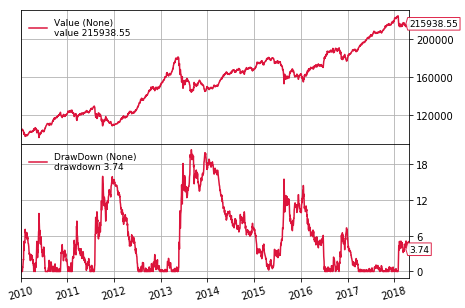

Sharpe Ratio:  1.0090604801205914
SQN:  1.1214373347543638
Final Portfolio Value: 215938.55




In [49]:
if __name__ == '__main__':
        
    # Create a cerebro entity
    cerebro = bt.Cerebro(stdstats=False)
        
    # Add the new datafeeds into cerebro
    for key in ex_reits_backtest_data.keys():
        data = CustomDataLoader(dataname=ex_reits_backtest_data[key])
        data.plotinfo.plot = False
        cerebro.adddata(data, name=key)
    
    # Add a strategy and define our holding period
    cerebro.addstrategy(MomentumStrategy, period=12)
    
    # Set our desired cash start
    cerebro.broker.setcash(100000.0)
    
    # Set the commission
    cerebro.broker.setcommission(commission=0.0012)
    cerebro.broker.set_checksubmit(False)

    # Add analyzers to cerebro
    #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
    cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.0, timeframe=bt.TimeFrame.Days)
    cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
    # Add observers to cerebro
    cerebro.addobserver(bt.observers.Value)
    cerebro.addobserver(bt.observers.DrawDown)

    # Print out the starting conditions
    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('Currently testing TS Momentum strategy' )
    
    # Run over everything
    strategies = cerebro.run()
    firstStrat = strategies[0]
    
    # Plot everything
    fig = cerebro.plot()
    
    # Print the analyzers
    #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
    print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
    print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
    # Get the pyfolio data and store it into a dictionary
    pyfoliozer = firstStrat.analyzers.pyfolio
    returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
    
    # Print out the final result
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('\n')


#### TS MOM with 1 month holding period 

Backtest months: 103


,Backtest
Annual return,9.1%
Cumulative returns,112.7%
Annual volatility,9.2%
Sharpe ratio,0.99
Calmar ratio,0.45
Stability,0.87
Max drawdown,-20.3%
Omega ratio,1.20
Sortino ratio,1.38
Skew,-0.65


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.27,2013-05-15,2013-08-28,2017-04-03,1014
1,14.31,2011-08-01,2011-12-20,2012-06-29,240
2,9.41,2010-04-26,2010-05-25,2010-07-14,58
3,8.46,2011-02-08,2011-03-17,2011-06-28,101
4,7.01,2010-01-14,2010-02-05,2010-04-14,65


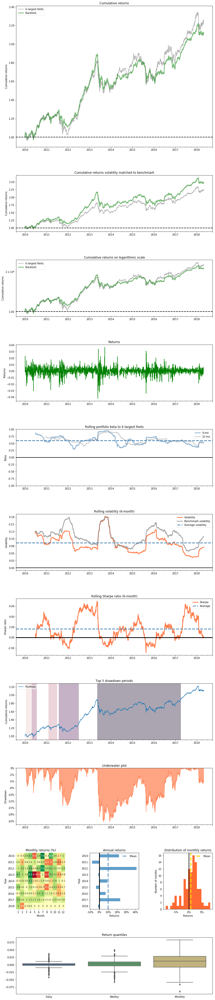

In [235]:
TS_MOM_1M = returns
create_custom_tear_sheet(returns=TS_MOM_1M, benchmark_rets=new_index_raw)

#### TS MOM with 3 months holding period 

Backtest months: 103


,Backtest
Annual return,8.8%
Cumulative returns,106.3%
Annual volatility,9.1%
Sharpe ratio,0.97
Calmar ratio,0.45
Stability,0.87
Max drawdown,-19.3%
Omega ratio,1.20
Sortino ratio,1.34
Skew,-0.67


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.33,2013-05-15,2013-08-28,2016-09-08,867
1,15.15,2011-08-01,2011-12-20,2012-07-11,248
2,9.46,2010-04-26,2010-05-25,2010-07-14,58
3,8.44,2011-02-08,2011-03-17,2011-06-29,102
4,7.15,2016-09-08,2016-12-23,2017-03-28,144


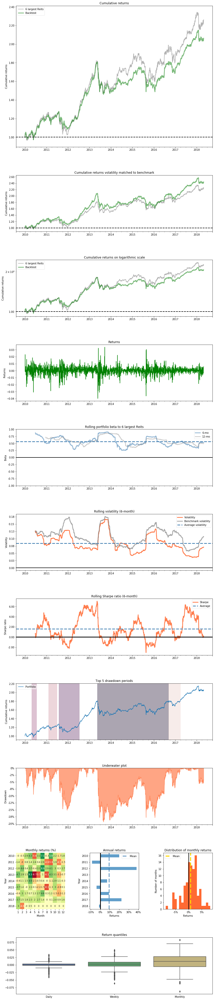

In [237]:
TS_MOM_3M = returns
create_custom_tear_sheet(returns=TS_MOM_3M, benchmark_rets=new_index_raw)

#### TS MOM with 6 months holding period 

Backtest months: 103


,Backtest
Annual return,9.3%
Cumulative returns,115.2%
Annual volatility,9.1%
Sharpe ratio,1.03
Calmar ratio,0.47
Stability,0.92
Max drawdown,-19.9%
Omega ratio,1.21
Sortino ratio,1.41
Skew,-0.74


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.86,2013-05-15,2013-08-28,2015-04-07,495
1,15.25,2015-04-27,2015-08-24,2016-07-07,314
2,13.96,2011-08-01,2011-10-05,2012-06-29,240
3,9.44,2010-04-26,2010-05-25,2010-07-14,58
4,8.46,2011-02-08,2011-03-17,2011-06-28,101


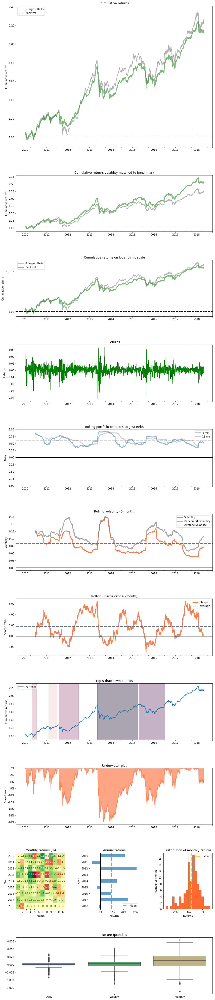

In [240]:
TS_MOM_6M = returns
create_custom_tear_sheet(returns=TS_MOM_6M, benchmark_rets=new_index_raw)

#### TS MOM with 9 months holding period 

Backtest months: 103


,Backtest
Annual return,10.7%
Cumulative returns,139.8%
Annual volatility,8.9%
Sharpe ratio,1.18
Calmar ratio,0.55
Stability,0.90
Max drawdown,-19.6%
Omega ratio,1.25
Sortino ratio,1.64
Skew,-0.72


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.60,2013-05-15,2013-08-28,2015-02-25,466
1,15.77,2015-04-27,2015-08-24,2016-07-18,321
2,13.96,2011-08-01,2011-10-05,2012-04-18,188
3,9.44,2010-04-26,2010-05-25,2010-07-14,58
4,7.42,2011-02-04,2011-03-17,2011-05-31,83


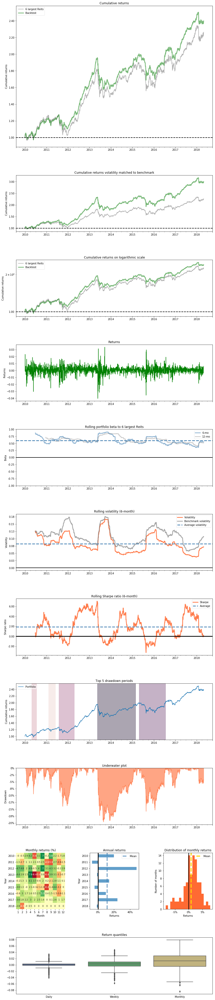

In [242]:
TS_MOM_9M = returns
create_custom_tear_sheet(returns=TS_MOM_9M, benchmark_rets=new_index_raw)

#### TS MOM with 12 months holding period 

Backtest months: 103


,Backtest
Annual return,9.8%
Cumulative returns,124.3%
Annual volatility,9.0%
Sharpe ratio,1.08
Calmar ratio,0.58
Stability,0.91
Max drawdown,-16.9%
Omega ratio,1.22
Sortino ratio,1.51
Skew,-0.66


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,16.90,2013-05-15,2013-08-28,2015-01-23,443
1,16.27,2015-04-27,2015-08-24,2016-07-13,318
2,15.95,2011-08-01,2011-10-05,2012-07-10,247
3,9.44,2010-04-26,2010-05-25,2010-07-14,58
4,8.46,2011-02-08,2011-03-17,2011-06-28,101


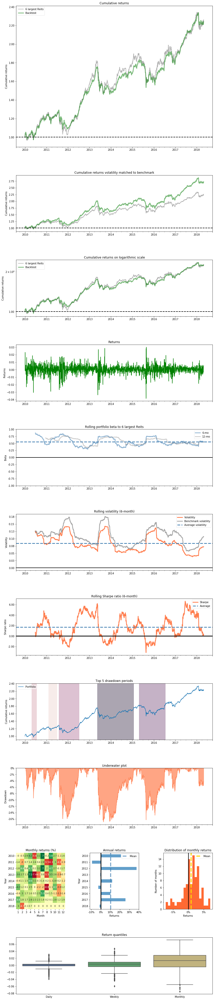

In [244]:
TS_MOM_12M = returns
create_custom_tear_sheet(returns=TS_MOM_12M, benchmark_rets=new_index_raw)

## Dual Momentum

In [252]:
# Create lists to store our raw_data
new_raw_datas_names = ['TSMOM 12-2', 'TSMOM 12-7', 'TSMOM 6-2']
new_raw_datas = []

# Loop through all the variation that we want to test
for i, j in lookback_period:
    reits_returns = lookback_returns(reits_standardized, i, j)
    top_p_rank_returns = top_percentile_rank_returns(reits_returns, n)
    # Create a combined signal
    combined_signal = ex_signal * top_p_rank_returns
    reits = create_signal(reits_standardized, combined_signal)
    adj_reits = adj_yahoo_data(reits)
    reits_backtest_data = adjust_backtest_dates(adj_reits, bt_start_date, bt_end_date)
    new_raw_datas.append(reits_backtest_data)
    
# Create an ordered dictionary storing all our processed data
new_full_raw_dict = OrderedDict(zip(new_raw_datas_names, new_raw_datas))

Starting Portfolio Value: 100000.00
Currently testing strategy TSMOM 12-2
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 100780 Starhill
2010-01-01, Buy 61436 AIMS
2010-01-01, Buy 71050 Fraser_Comm
2010-12-31, Close 0.68 0.59 0.00 0.00 0.00 1.00 0.00 0.40 0.31 0.00 0.00 0.61 0.78 0.52 0.66 1.32 0.96 0.50 0.41 0.00 1.30 0.00 1.17 0.00 0.43 0.00 0.84 0.00 0.30 0.00 0.00 0.00 0.00 0.00 1.25 0.99 
2010-12-31, Current Positions: 0 0 0 0 0 0 0 100780 0 0 0 61436 0 71050 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2011-01-03, Sell 100780 Starhill
2011-01-03, Sell 61436 AIMS
2011-01-03, Sell 71050 Fraser_Comm
2011-01-03, Buy 181396 Lippo_Mall
2011-01-03, Buy 43364 Ascendas
2011-01-03, OPERATION PROFIT, GROSS 8258.72, NET 8172

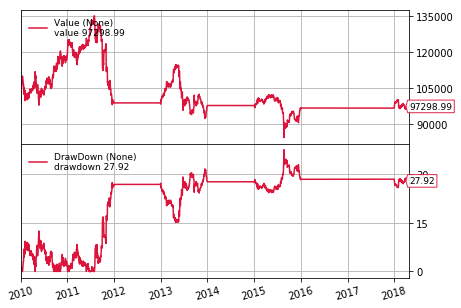

Sharpe Ratio:  0.028589352967482547
SQN:  -0.160284127356702
Final Portfolio Value: 97298.99


Starting Portfolio Value: 100000.00
Currently testing strategy TSMOM 12-7
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 71050 Fraser_Comm
2010-01-01, Buy 27456 Captland_Mall
2010-01-01, Buy 32546 CDL_Hos
2010-12-31, Close 0.68 0.59 0.00 0.00 0.00 1.00 0.00 0.40 0.31 0.00 0.00 0.61 0.78 0.52 0.66 1.32 0.96 0.50 0.41 0.00 1.30 0.00 1.17 0.00 0.43 0.00 0.84 0.00 0.30 0.00 0.00 0.00 0.00 0.00 1.25 0.99 
2010-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 71050 0 27456 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 32546 0 
2011-01-03, Sell 71050 Fraser_Comm
2011-01-03, Sell 27456 Captland_Mall
2011-01-03, Sell 32546 CDL_Hos
2011-01-03

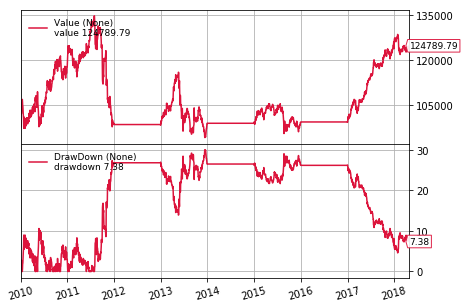

Sharpe Ratio:  0.2798421849010799
SQN:  0.6181662350670556
Final Portfolio Value: 124789.79


Starting Portfolio Value: 100000.00
Currently testing strategy TSMOM 6-2
2009-12-31, Close 0.62 0.44 0.00 0.00 0.00 0.87 0.00 0.31 0.28 0.00 0.00 0.52 0.78 0.43 0.00 1.13 0.69 0.00 0.00 0.00 1.23 0.00 0.83 0.00 0.33 0.00 0.64 0.00 0.23 0.00 0.00 0.00 0.00 0.00 0.97 0.84 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 100780 Starhill
2010-01-01, Buy 61436 AIMS
2010-01-01, Buy 41175 Captret_China
2010-12-31, Close 0.68 0.59 0.00 0.00 0.00 1.00 0.00 0.40 0.31 0.00 0.00 0.61 0.78 0.52 0.66 1.32 0.96 0.50 0.41 0.00 1.30 0.00 1.17 0.00 0.43 0.00 0.84 0.00 0.30 0.00 0.00 0.00 0.00 0.00 1.25 0.99 
2010-12-31, Current Positions: 0 0 0 0 0 0 0 100780 0 0 0 61436 41175 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2011-01-03, Sell 100780 Starhill
2011-01-03, Sell 61436 AIMS
2011-01-03, Sell 41175 Captret_China
2011-01-03, Buy 17408

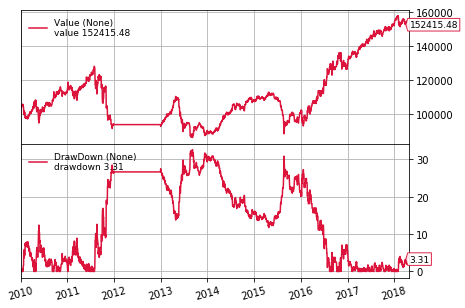

Sharpe Ratio:  0.4283604968910837
SQN:  1.2371346127580483
Final Portfolio Value: 152415.48




In [264]:
new_full_returns_dict = {}

if __name__ == '__main__':
    
    for i in new_full_raw_dict.keys():
        
        # Create a cerebro entity
        cerebro = bt.Cerebro(stdstats=False)
        
        # Add the datafeeds into cerebro
        for key in new_full_raw_dict[i].keys():
            data = CustomDataLoader(dataname=new_full_raw_dict[i][key])
            data.plotinfo.plot = False
            cerebro.adddata(data, name=key)
    
        # Add a strategy and define our holding period
        cerebro.addstrategy(MomentumStrategy, period=12)
    
        # Set our desired cash start
        cerebro.broker.setcash(100000.0)
    
        # Set the commission
        cerebro.broker.setcommission(commission=0.0012)
        cerebro.broker.set_checksubmit(False)

        # Add analyzers to cerebro
        #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
        cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.0, timeframe=bt.TimeFrame.Days)
        cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
        cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
        # Add observers to cerebro
        cerebro.addobserver(bt.observers.Value)
        cerebro.addobserver(bt.observers.DrawDown)

        # Print out the starting conditions
        print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
        print('Currently testing strategy ' + str(i))
    
        # Run over everything
        strategies = cerebro.run()
        firstStrat = strategies[0]
    
        # Plot everything
        fig = cerebro.plot()
    
        # Print the analyzers
        #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
        print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
        print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
        # Get the pyfolio data and store it into a dictionary
        pyfoliozer = firstStrat.analyzers.pyfolio
        returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
        new_full_returns_dict[str(i)] = returns
    
        # Print out the final result
        print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
        print('\n')

In [257]:
new_full_returns_dict_1M = new_full_returns_dict.copy()

In [259]:
new_full_returns_dict_3M = new_full_returns_dict.copy()

In [261]:
new_full_returns_dict_6M = new_full_returns_dict.copy()

In [263]:
new_full_returns_dict_9M = new_full_returns_dict.copy()

In [265]:
new_full_returns_dict_12M = new_full_returns_dict.copy()

#### TS+ CS MOM 12-7 with 1 month holding period 

Backtest months: 103


,Backtest
Annual return,4.3%
Cumulative returns,43.8%
Annual volatility,10.1%
Sharpe ratio,0.47
Calmar ratio,0.23
Stability,0.81
Max drawdown,-19.0%
Omega ratio,1.11
Sortino ratio,0.67
Skew,-0.11


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.04,2013-05-20,2013-06-25,2017-09-08,1125
1,9.31,2010-04-27,2010-05-25,2010-10-07,118
2,8.98,2010-01-14,2010-01-27,2010-03-29,53
3,7.81,2011-01-17,2011-03-17,2011-07-01,120
4,7.18,2011-07-29,2011-08-11,2011-09-16,36


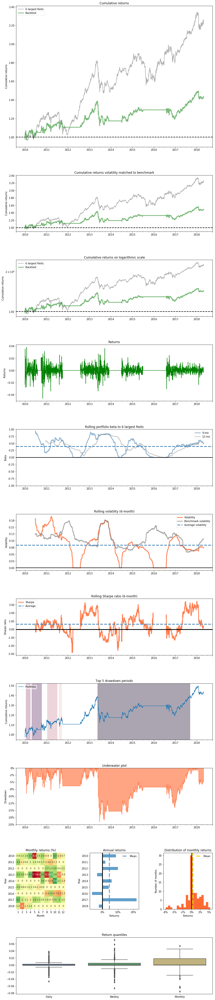

In [266]:
MOMTS12_7_1_returns = new_full_returns_dict_1M['TSMOM 12-7']
create_custom_tear_sheet(returns=MOMTS12_7_1_returns, benchmark_rets=new_index_raw)

#### TS+ CS MOM 12-7 with 3 months holding period 

Backtest months: 103


,Backtest
Annual return,4.8%
Cumulative returns,49.9%
Annual volatility,10.2%
Sharpe ratio,0.51
Calmar ratio,0.28
Stability,0.79
Max drawdown,-17.1%
Omega ratio,1.12
Sortino ratio,0.74
Skew,-0.06


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,17.07,2013-05-09,2013-06-25,2015-04-09,501
1,11.67,2015-04-24,2016-11-17,2017-06-12,557
2,8.98,2010-01-14,2010-01-27,2010-05-13,86
3,8.31,2011-01-07,2011-03-17,2013-01-14,527
4,6.03,2010-05-13,2010-05-25,2010-07-12,43


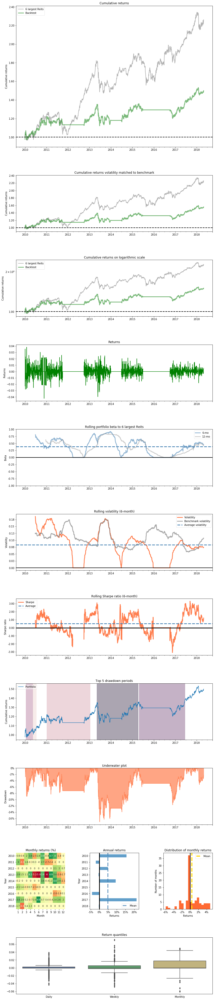

In [267]:
MOMTS12_7_3_returns = new_full_returns_dict_3M['TSMOM 12-7']
create_custom_tear_sheet(returns=MOMTS12_7_3_returns, benchmark_rets=new_index_raw)

#### TS+ CS MOM 12-7 with 6 months holding period 

Backtest months: 103


,Backtest
Annual return,5.6%
Cumulative returns,60.4%
Annual volatility,10.2%
Sharpe ratio,0.59
Calmar ratio,0.33
Stability,0.87
Max drawdown,-16.8%
Omega ratio,1.14
Sortino ratio,0.86
Skew,0.07


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,16.84,2013-05-20,2013-06-25,2015-04-24,505
1,10.58,2010-05-13,2010-05-25,2010-09-15,90
2,8.98,2010-01-14,2010-01-27,2010-04-26,73
3,8.31,2011-01-17,2011-03-17,2011-05-31,97
4,8.18,2011-08-03,2011-12-15,2013-03-28,432


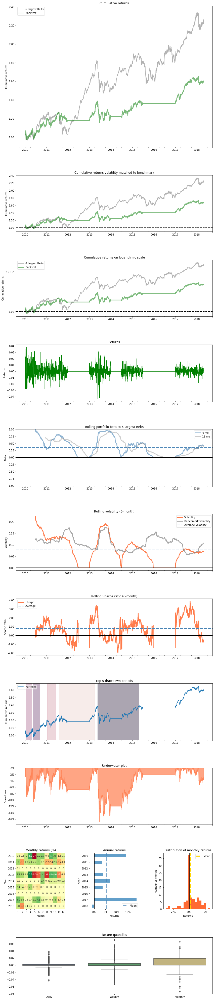

In [268]:
MOMTS12_7_6_returns = new_full_returns_dict_6M['TSMOM 12-7']
create_custom_tear_sheet(returns=MOMTS12_7_6_returns, benchmark_rets=new_index_raw)

#### TS+ CS MOM 12-7 with 9 months holding period 

Backtest months: 103


,Backtest
Annual return,7.9%
Cumulative returns,93.0%
Annual volatility,13.0%
Sharpe ratio,0.65
Calmar ratio,0.43
Stability,0.92
Max drawdown,-18.3%
Omega ratio,1.15
Sortino ratio,0.95
Skew,0.01


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.29,2013-05-20,2013-12-16,2014-08-19,327
1,16.38,2015-04-24,2015-08-24,2017-05-08,532
2,13.85,2010-10-11,2011-03-16,2012-02-15,353
3,10.58,2010-05-13,2010-05-25,2010-07-27,54
4,8.98,2010-01-14,2010-01-27,2010-04-26,73


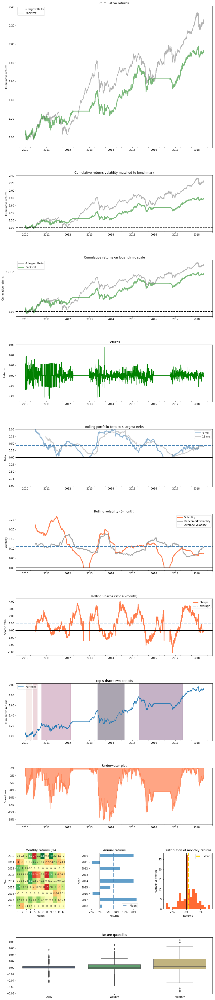

In [269]:
MOMTS12_7_9_returns = new_full_returns_dict_9M['TSMOM 12-7']
create_custom_tear_sheet(returns=MOMTS12_7_9_returns, benchmark_rets=new_index_raw)

#### TS+ CS MOM 12-7 with 12 months holding period 

Backtest months: 103


,Backtest
Annual return,2.6%
Cumulative returns,24.8%
Annual volatility,11.6%
Sharpe ratio,0.28
Calmar ratio,0.09
Stability,0.00
Max drawdown,-30.0%
Omega ratio,1.07
Sortino ratio,0.39
Skew,-0.72


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,29.97,2011-08-02,2013-12-12,NaT,NaN
1,10.58,2010-05-13,2010-05-25,2010-07-27,54
2,8.98,2010-01-14,2010-01-27,2010-04-26,73
3,8.28,2011-01-17,2011-03-17,2011-05-31,97
4,6.51,2010-11-09,2010-11-29,2011-01-05,42


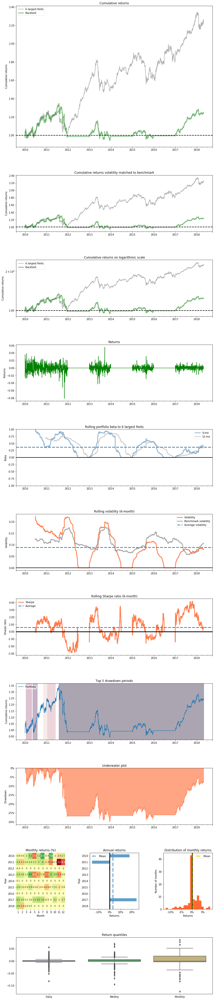

In [270]:
MOMTS12_7_12_returns = new_full_returns_dict_12M['TSMOM 12-7']
create_custom_tear_sheet(returns=MOMTS12_7_12_returns, benchmark_rets=new_index_raw)

So it seems like our dual momentum strategy didn't work out as expected.

During our research on cross-sectional momentum, our MOM 12-7 portfolio consistently outperformed our MOM 6-2 portfolio and even our MOM 12-2 portfolio, confirming the study by ... (2012) that using intermediate cross-sectional momentum is able to generate better returns that a simple MOM 12-2 strategy.

Now, let's further refine our MOM 12-7 strategy by selecting only the top 20% of stocks that have had the best lagged 12-7 months return if they did not rank within the top 20% of stocks that had the best lagged 6-2 months return. An alternative way to look at this would be to go long the MOM 7-12 portfolio while shorting the MOM 6-2 portfolio. This is an idea that we shall explore when we incorporate short-selling into our momentum strategies. Note however that SGX imposes harsh requirements on short-selling and charges interest of 6% per annum.

In [59]:
MOM_12_7 = full_raw_dict['MOM 12-7']
MOM_6_2 = full_raw_dict['MOM 6-2']

new_mom = {}

for key in MOM_6_2.keys():
    # Create a reversed signal for MOM_6_2
    reversed_signal = -MOM_6_2[key]['Signal']
    # Create a new combined signal series object
    combined_signal = MOM_12_7[key]['Signal'] + reversed_signal
    
    # Copy the original MOM 12-7 data into our new_mom dictionary
    new_mom[key] = MOM_12_7[key].copy()
    
    # Replace the signal column with the new combined signal
    new_mom[key]['Signal'] = combined_signal

Starting Portfolio Value: 100000.00
Currently testing MOM 12-7 exc MOM 6-2 strategy
2009-12-31, Close 0.44 0.00 0.00 0.33 0.23 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.64 0.00 1.23 0.87 0.00 0.62 0.00 0.00 0.00 0.69 0.78 0.43 0.84 0.97 0.00 0.83 0.00 0.00 0.28 0.52 0.00 1.13 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 71050 Fraser_Comm
2010-01-01, Buy 32546 CDL_Hos
2010-01-01, Buy 27456 Captland_Mall
2010-12-31, Close 0.59 0.50 0.00 0.43 0.30 0.00 0.40 0.41 0.00 0.00 0.00 0.00 0.00 0.00 0.84 0.00 1.30 1.00 0.66 0.68 0.00 0.00 0.00 0.96 0.78 0.52 0.99 1.25 0.00 1.17 0.00 0.00 0.31 0.61 0.00 1.32 
2010-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 71050 0 32546 0 0 0 0 0 0 0 27456 
2011-01-03, Sell 71050 Fraser_Comm
2011-01-03, Sell 32546 CDL_Hos
2011-01-03, Sell 27456 Captland_Mall
2011-01-03, Buy 87225 Ascendas
2011-01-03, OPERATION PROFIT, GROSS 4855.88, NET 4773.25
2011-01

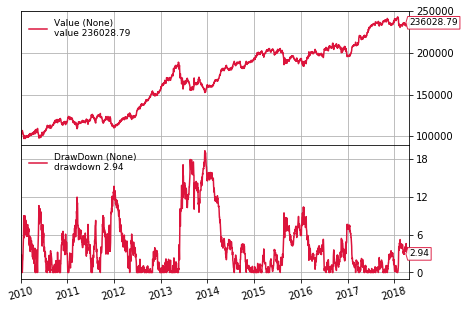

Sharpe Ratio:  0.8175121096566196
SQN:  3.6479372746013112
Final Portfolio Value: 236028.79




In [69]:
if __name__ == '__main__':
        
    # Create a cerebro entity
    cerebro = bt.Cerebro(stdstats=False)
        
    # Add the new datafeeds into cerebro
    for key in new_mom.keys():
        data = CustomDataLoader(dataname=new_mom[key])
        data.plotinfo.plot = False
        cerebro.adddata(data, name=key)
    
    # Add a strategy and define our holding period
    cerebro.addstrategy(MomentumStrategy, period=12)
    
    # Set our desired cash start
    cerebro.broker.setcash(100000.0)
    
    # Set the commission
    cerebro.broker.setcommission(commission=0.0012)
    cerebro.broker.set_checksubmit(False)

    # Add analyzers to cerebro
    #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
    cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.0, timeframe=bt.TimeFrame.Days)
    cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
    # Add observers to cerebro
    cerebro.addobserver(bt.observers.Value)
    cerebro.addobserver(bt.observers.DrawDown)

    # Print out the starting conditions
    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('Currently testing MOM 12-7 exc MOM 6-2 strategy')
    
    # Run over everything
    strategies = cerebro.run()
    firstStrat = strategies[0]
    
    # Plot everything
    fig = cerebro.plot()
    
    # Print the analyzers
    #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
    print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
    print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
    # Get the pyfolio data and store it into a dictionary
    pyfoliozer = firstStrat.analyzers.pyfolio
    returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
    
    # Print out the final result
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('\n')

#### MOM 12-7 ex 6-2 with 1 month holding period

Backtest months: 103


,Backtest
Annual return,10.6%
Cumulative returns,137.9%
Annual volatility,12.1%
Sharpe ratio,0.89
Calmar ratio,0.48
Stability,0.85
Max drawdown,-21.9%
Omega ratio,1.17
Sortino ratio,1.30
Skew,-0.05


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.89,2015-04-24,2015-08-24,2017-05-26,546
1,16.25,2013-05-20,2013-06-25,2014-04-24,244
2,11.30,2011-01-12,2011-10-04,2012-02-29,296
3,9.31,2010-04-27,2010-05-25,2010-09-07,96
4,8.98,2010-01-14,2010-01-27,2010-03-29,53


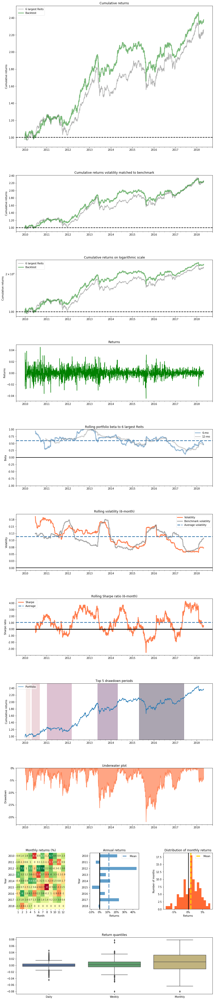

In [62]:
ex_MOM12_7_1 = returns
create_custom_tear_sheet(returns=ex_MOM12_7_1, benchmark_rets=new_index_raw)

#### MOM 12-7 ex 6-2 with 3 months holding period

Backtest months: 103


,Backtest
Annual return,11.1%
Cumulative returns,148.0%
Annual volatility,12.7%
Sharpe ratio,0.89
Calmar ratio,0.49
Stability,0.89
Max drawdown,-22.9%
Omega ratio,1.17
Sortino ratio,1.28
Skew,-0.24


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,22.87,2015-04-24,2015-08-24,2016-07-12,318
1,17.34,2013-05-09,2013-06-25,2015-02-24,469
2,11.96,2011-01-12,2011-03-18,2012-04-05,322
3,8.98,2010-01-14,2010-01-27,2010-05-13,86
4,7.59,2012-05-09,2012-06-05,2012-07-06,43


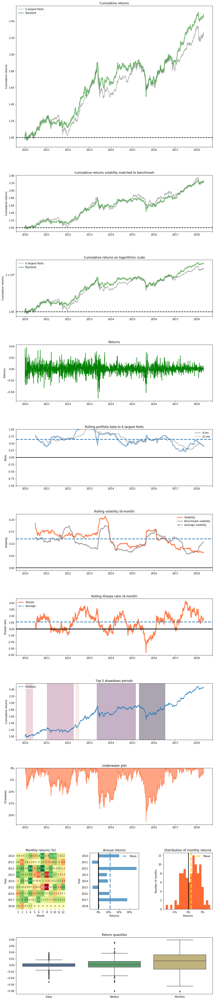

In [64]:
ex_MOM12_7_3 = returns
create_custom_tear_sheet(returns=ex_MOM12_7_3, benchmark_rets=new_index_raw)

#### MOM 12-7 ex 6-2 with 6 months holding period

Backtest months: 103


,Backtest
Annual return,10.8%
Cumulative returns,142.2%
Annual volatility,12.8%
Sharpe ratio,0.86
Calmar ratio,0.52
Stability,0.86
Max drawdown,-20.7%
Omega ratio,1.17
Sortino ratio,1.25
Skew,-0.14


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.68,2015-04-28,2015-08-24,2016-09-06,356
1,17.11,2013-05-20,2013-06-25,2015-01-27,442
2,11.96,2011-01-12,2011-03-18,2012-03-08,302
3,10.58,2010-05-13,2010-05-25,2010-08-10,64
4,9.23,2016-09-07,2016-12-23,2017-03-30,147


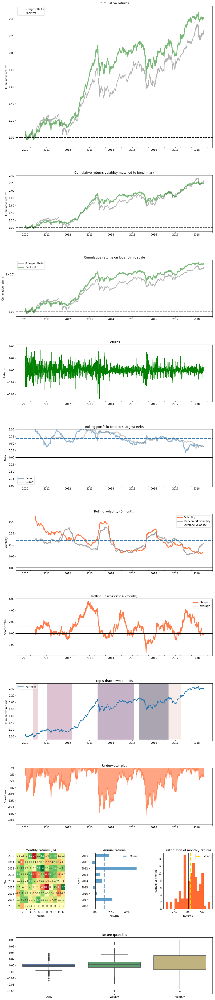

In [66]:
ex_MOM12_7_6 = returns
create_custom_tear_sheet(returns=ex_MOM12_7_6, benchmark_rets=new_index_raw)

#### MOM 12-7 ex 6-2 with 9 months holding period

Backtest months: 103


,Backtest
Annual return,11.5%
Cumulative returns,155.0%
Annual volatility,12.4%
Sharpe ratio,0.94
Calmar ratio,0.61
Stability,0.88
Max drawdown,-18.7%
Omega ratio,1.18
Sortino ratio,1.38
Skew,0.07


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.71,2013-05-20,2013-12-16,2015-04-09,494
1,16.50,2015-04-24,2015-08-24,2016-09-06,358
2,10.58,2010-05-13,2010-05-25,2010-07-27,54
3,8.98,2010-01-14,2010-01-27,2010-04-26,73
4,8.60,2011-02-14,2011-03-17,2011-05-27,75


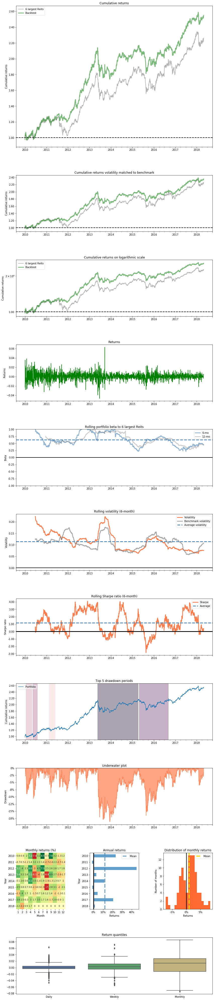

In [68]:
ex_MOM12_7_9 = returns
create_custom_tear_sheet(returns=ex_MOM12_7_9, benchmark_rets=new_index_raw)

#### MOM 12-7 ex 6-2 with 12 months holding period

Backtest months: 103


,Backtest
Annual return,10.5%
Cumulative returns,136.0%
Annual volatility,13.3%
Sharpe ratio,0.82
Calmar ratio,0.54
Stability,0.93
Max drawdown,-19.3%
Omega ratio,1.16
Sortino ratio,1.20
Skew,0.11


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,19.26,2013-05-20,2013-12-12,2014-07-29,312
1,13.64,2011-09-16,2012-01-02,2012-05-03,165
2,11.92,2011-01-12,2011-03-18,2011-07-07,127
3,10.58,2010-05-13,2010-05-25,2010-07-27,54
4,10.34,2015-07-24,2016-01-21,2016-07-18,257


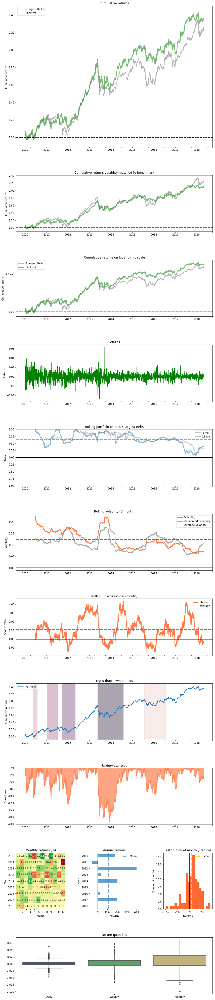

In [70]:
ex_MOM12_7_12 = returns
create_custom_tear_sheet(returns=ex_MOM12_7_12, benchmark_rets=new_index_raw)

In [75]:
# Define our NewMomentum Strategy 
class NewMomentumStrategy(bt.Strategy):
    params = (('period', 1), 
             ('lpositions', 1),
              ('spositions', 1),
             )

    def log(self, txt, dt=None):
        ''' Logging function for this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def __init__(self):
        # To keep track of pending orders and buy price/commission
        self.order = None
        
    def notify_order(self, order):
        if order.status == order.Completed:
            n = order.info.name
            size = order.size
            if order.isbuy():
                self.log('Buy ' + str(size) + ' ' + str(n))
                
            else:
                self.log('Sell ' + str(-size) + ' ' + str(n))
        
        elif order.status == order.Rejected:
            self.log('Order is rejected')

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log('OPERATION PROFIT, GROSS %.2f, NET %.2f' %
                 (trade.pnl, trade.pnlcomm))

    def start(self):
        self.order = None
    
    def next(self):

        #start of backtesting period
        b_test_start = '12/31/2009'
        
        # end of backtesting period
        b_test_end = '4/1/2018'
        
        # End of the business month for Singapore timezone to rebalance 
        # our portfolio (vary from 1Q, 2Q, 4Q)
        end_date_range = pd.date_range(b_test_start, b_test_end, 
                                   freq='BM', tz='Asia/Singapore')[::self.p.period]
    
        # We will be rebalancing our portfolio every month 
        if self.datas[0].datetime.date(0) in end_date_range:
            # Simply log the closing price of the series from the reference
            self.log('Close ' + '%.2f '*len(self.datas) % (tuple(self.datas[i].close[0]
                                                            for i in range(len(self.datas)))))
            
            # log the positions
            self.log('Current Positions: '+ '%d '*len(self.datas) % tuple([self.getposition(self.datas[i]).size 
                                          for i in range(len(self.datas))]))
            
            # list of stocks to buy 
            target_buy = [i for i in range(len(self.datas)) if self.datas[i].signal[1] > 0]
            
            # list of stocks to short
            target_short = [i for i in range(len(self.datas)) if self.datas[i].signal[1] < 0]
            
            # Log the number of stocks to be bought
            self.p.lpositions = len(target_buy)
            
            # Log the number of stocks to be sold
            self.p.spositions = len(target_short)
            
            # list of stocks to sell
            target_sale = [i for i in range(len(self.datas)) if i not in target_buy+target_short]                                    
            
            for j in target_sale:
                # if there is an existing position, sell the stock
                if not self.getposition(self.datas[j]).size == 0:
                    self.order = self.order_target_size(target=0, 
                                                        data=self.datas[j])
                    if self.order is not None:
                        self.order.addinfo(name=self.datas[j]._name)
                        
            for i in target_buy:
                # buy the stock according to the number of stocks in our target_buy list
                self.order = self.order_target_percent(target=np.round(0.97/self.p.lpositions, 2), 
                                                          data=self.datas[i],
                                                      price=self.datas[i].high[1],
                                                       exectype=bt.Order.Limit)
                if self.order is not None:
                    self.order.addinfo(name=self.datas[i]._name)
                    
            for i in target_short:
                # short the stock according to the number of stocks in our target_short list
                self.order = self.order_target_percent(target=-np.round(0.97/self.p.spositions, 2), 
                                                          data=self.datas[i],
                                                      price=self.datas[i].high[1],
                                                       exectype=bt.Order.Limit)
                if self.order is not None:
                    self.order.addinfo(name=self.datas[i]._name)

Starting Portfolio Value: 100000.00
Currently testing New MOM 12-7 exc MOM 6-2 strategy
2009-12-31, Close 0.44 0.00 0.00 0.33 0.23 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.64 0.00 1.23 0.87 0.00 0.62 0.00 0.00 0.00 0.69 0.78 0.43 0.84 0.97 0.00 0.83 0.00 0.00 0.28 0.52 0.00 1.13 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 71050 Fraser_Comm
2010-01-01, Buy 32546 CDL_Hos
2010-01-01, Buy 27456 Captland_Mall
2010-01-01, Sell 100780 Starhill
2010-01-01, Sell 41175 Captret_China
2010-01-01, Sell 61436 AIMS
2010-06-30, Close 0.49 0.49 0.00 0.36 0.27 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.66 0.00 1.10 0.84 0.00 0.60 0.00 0.00 0.00 0.74 0.75 0.44 0.83 1.05 0.00 0.94 0.00 0.00 0.27 0.55 0.00 1.22 
2010-06-30, Current Positions: 0 0 0 0 0 0 -100780 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 -41175 71050 0 32546 0 0 0 0 0 -61436 0 27456 
2010-07-01, Buy 41175 Captret_China
2010-07-01, Sell 71050 Fraser_Comm
2010-07-0

2017-12-29, Current Positions: 0 0 0 -12813 0 0 -22341 38099 -21055 0 0 23098 -23970 0 0 0 6561 7934 0 -14560 0 0 0 0 10239 0 0 0 0 0 0 0 0 0 -17247 0 
2018-01-01, Sell 23098 Frasers_Hos
2018-01-01, Sell 6561 Ascendas
2018-01-01, Sell 7934 Frasers_Cpoint
2018-01-01, Sell 10239 Captret_China
2018-01-01, Buy 23171 First
2018-01-01, Buy 41138 Starhill
2018-01-01, Buy 43942 OUE_Comm
2018-01-01, Buy 18941 IREIT
2018-01-01, Buy 26118 Ascott
2018-01-01, Buy 30509 SPH
2018-01-01, Buy 6829 Captland_Mall
2018-01-01, Sell 26141 ESR
2018-01-01, Sell 74503 Sabana
2018-01-01, Buy 2414 EC_World
2018-01-01, Sell 21826 Soilbuild
2018-01-01, Sell 19301 BHG
2018-01-01, Sell 36157 Lippo_Mall
2018-01-01, Sell 10570 AIMS
2018-01-01, OPERATION PROFIT, GROSS 1886.10, NET 1845.58
2018-01-01, OPERATION PROFIT, GROSS 1067.54, NET 1027.31
2018-01-01, OPERATION PROFIT, GROSS 1210.76, NET 1170.69
2018-01-01, OPERATION PROFIT, GROSS 142.40, NET 103.22
2018-01-01, OPERATION PROFIT, GROSS -1091.22, NET -1131.93
2018-0

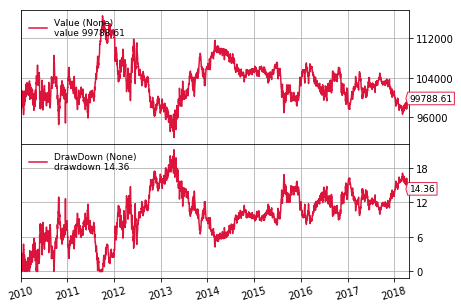

Sharpe Ratio:  0.06565405135138416
SQN:  0.019065457688320304
Final Portfolio Value: 99788.61




In [119]:
if __name__ == '__main__':
        
    # Create a cerebro entity
    cerebro = bt.Cerebro(stdstats=False)
        
    # Add the new datafeeds into cerebro
    for key in new_mom.keys():
        data = CustomDataLoader(dataname=new_mom[key])
        data.plotinfo.plot = False
        cerebro.adddata(data, name=key)
    
    # Add a strategy and define our holding period
    cerebro.addstrategy(NewMomentumStrategy, period=6)
    
    # Set our desired cash start
    cerebro.broker.setcash(100000.0)
    
    # Set the commission
    cerebro.broker.setcommission(commission=0.0012)
    cerebro.broker.set_checksubmit(False)

    # Add analyzers to cerebro
    #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
    cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.00, timeframe=bt.TimeFrame.Days)
    cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
    # Add observers to cerebro
    cerebro.addobserver(bt.observers.Value)
    cerebro.addobserver(bt.observers.DrawDown)

    # Print out the starting conditions
    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('Currently testing New MOM 12-7 exc MOM 6-2 strategy')
    
    # Run over everything
    strategies = cerebro.run()
    firstStrat = strategies[0]
    
    # Plot everything
    fig = cerebro.plot()
    
    # Print the analyzers
    #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
    print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
    print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
    # Get the pyfolio data and store it into a dictionary
    pyfoliozer = firstStrat.analyzers.pyfolio
    returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
    
    # Print out the final result
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('\n')

Backtest months: 103


,Backtest
Annual return,4.7%
Cumulative returns,48.4%
Annual volatility,13.5%
Sharpe ratio,0.41
Calmar ratio,0.23
Stability,0.80
Max drawdown,-20.5%
Omega ratio,1.07
Sortino ratio,0.59
Skew,0.02


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,20.46,2012-11-21,2013-04-15,2014-02-27,332
1,17.99,2014-04-25,2015-08-25,2016-06-27,567
2,14.16,2010-09-17,2011-05-31,2011-09-26,267
3,11.95,2011-10-05,2012-02-06,2012-10-08,264
4,6.93,2010-03-11,2010-04-26,2010-05-11,44


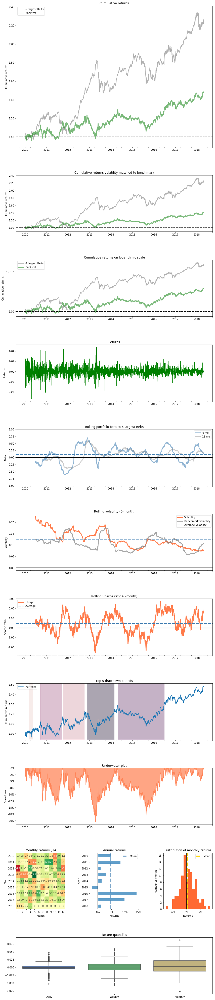

In [118]:
create_custom_tear_sheet(returns=returns, benchmark_rets=new_index_raw)

In [ ]:
from collections import OrderedDict

# Set the top percentile of stocks to be included in our portfolio 
n = 0.2

# Start date and end date of backtest
bt_start_date = '2009-12-31'
bt_end_date = '2018-04-30'

# Set the lookback_period to calculate the past returns
lookback_period = [(12, 2) , (12, 7), (6, 2)]

# Create lists to store our raw_data
raw_datas_names = ['MOM 12-2', 'MOM 12-7', 'MOM 6-2']
raw_datas = []

# Loop through all the variation that we want to test
for i, j in lookback_period:
    reits_returns = lookback_returns(reits_standardized, i, j)
    top_p_rank_returns = top_percentile_rank_returns(reits_returns, n)
    reits = create_signal(reits_standardized, top_p_rank_returns)
    adj_reits = adj_yahoo_data(reits)
    reits_backtest_data = adjust_backtest_dates(adj_reits, bt_start_date, bt_end_date)
    raw_datas.append(reits_backtest_data)
    
# Create an ordered dictionary storing all our processed data
full_raw_dict = OrderedDict(zip(raw_datas_names, raw_datas))

In [110]:
reits_returns_12_7 = lookback_returns(reits_standardized, 12, 7)
top_p_rank_returns = top_percentile_rank_returns(reits_returns_12_7, 0.1)
bottom_p_rank_returns = top_percentile_rank_returns(-reits_returns_12_7, 0.1)

combined_p_rank_returns = top_p_rank_returns - bottom_p_rank_returns
full_reits = create_signal(reits_standardized, combined_p_rank_returns)
full_adj_reits = adj_yahoo_data(full_reits)
full_reits_backtest_data = adjust_backtest_dates(full_adj_reits, bt_start_date, bt_end_date)

Starting Portfolio Value: 100000.00
Currently testing Long Best MOM 12-7, Short Worst MOM 6-2 strategy
2009-12-31, Close 0.44 0.00 0.00 0.33 0.23 0.00 0.31 0.00 0.00 0.84 0.00 0.00 0.00 0.64 0.00 1.23 0.87 0.00 0.62 0.00 0.00 0.00 0.00 0.69 0.78 0.43 0.00 0.00 0.00 0.83 0.00 0.00 0.28 0.52 0.97 1.13 
2009-12-31, Current Positions: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 
2010-01-01, Buy 106575 Fraser_Comm
2010-01-01, Buy 41184 Captland_Mall
2010-01-01, Sell 108421 Mapletree_Log
2010-01-01, Sell 61763 Captret_China
2010-03-31, Close 0.49 0.00 0.00 0.35 0.24 0.00 0.34 0.00 0.00 0.83 0.00 0.00 0.00 0.64 0.00 1.15 0.86 0.00 0.66 0.00 0.00 0.00 0.00 0.65 0.75 0.47 0.00 0.00 0.00 0.92 0.00 0.00 0.27 0.53 1.02 1.16 
2010-03-31, Current Positions: -108421 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 -61763 106575 0 0 0 0 0 0 0 0 0 41184 
2010-04-01, Buy 108421 Mapletree_Log
2010-04-01, Buy 61763 Captret_China
2010-04-01, Sell 106575 Fraser_Comm
2010-04-01, Buy 

2015-07-01, Sell 22521 Captret_China
2015-07-01, Sell 40492 Mapletree_Gcc
2015-07-01, OPERATION PROFIT, GROSS -938.45, NET -1336.07
2015-07-01, OPERATION PROFIT, GROSS -240.27, NET -637.06
2015-07-01, OPERATION PROFIT, GROSS -988.23, NET -1063.66
2015-07-01, OPERATION PROFIT, GROSS -2347.63, NET -3043.52
2015-07-01, OPERATION PROFIT, GROSS -103.38, NET -183.58
2015-07-01, OPERATION PROFIT, GROSS 2623.01, NET 2544.07
2015-09-30, Close 0.81 0.72 0.58 1.10 0.49 0.00 0.64 0.00 0.00 1.29 0.58 0.53 0.63 0.82 0.51 1.94 1.63 1.26 1.00 0.54 1.06 0.59 0.00 1.10 1.19 1.12 0.74 0.80 0.50 2.02 0.50 0.87 0.26 1.07 1.06 1.63 
2015-09-30, Current Positions: 0 0 0 0 59874 0 0 0 0 -22267 0 0 0 0 0 0 0 0 0 0 0 0 0 0 -22521 0 -40492 0 59536 0 0 0 110597 0 0 0 
2015-10-01, Sell 59874 ESR
2015-10-01, Buy 22267 Suntec
2015-10-01, Buy 22521 Captret_China
2015-10-01, Buy 63282 IREIT
2015-10-01, Buy 6745 Sabana
2015-10-01, Buy 16227 Lippo_Mall
2015-10-01, Sell 17038 Ascendas
2015-10-01, Sell 4581 Mapletree_Gcc


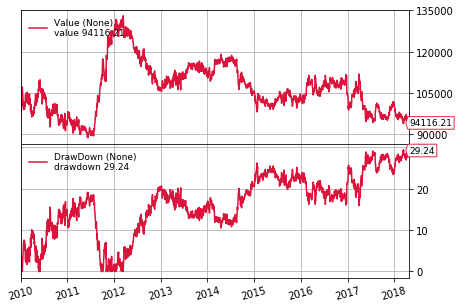

Sharpe Ratio:  0.03622006611107965
SQN:  -0.07763797005629647
Final Portfolio Value: 94116.21




In [121]:
if __name__ == '__main__':
        
    # Create a cerebro entity
    cerebro = bt.Cerebro(stdstats=False)
        
    # Add the new datafeeds into cerebro
    for key in full_reits_backtest_data.keys():
        data = CustomDataLoader(dataname=full_reits_backtest_data[key])
        data.plotinfo.plot = False
        cerebro.adddata(data, name=key)
    
    # Add a strategy and define our holding period
    cerebro.addstrategy(NewMomentumStrategy, period=3)
    
    # Set our desired cash start
    cerebro.broker.setcash(100000.0)
    
    # Set the commission
    cerebro.broker.setcommission(commission=0.0012, interest=0.04)
    cerebro.broker.set_checksubmit(False)

    # Add analyzers to cerebro
    #cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name='ta')
    cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name='mysharpe', riskfreerate=0.00, timeframe=bt.TimeFrame.Days)
    cerebro.addanalyzer(bt.analyzers.SQN, _name='sqn')
    cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')
    
    # Add observers to cerebro
    cerebro.addobserver(bt.observers.Value)
    cerebro.addobserver(bt.observers.DrawDown)

    # Print out the starting conditions
    print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('Currently testing Long Best MOM 12-7, Short Worst MOM 6-2 strategy')
    
    # Run over everything
    strategies = cerebro.run()
    firstStrat = strategies[0]
    
    # Plot everything
    fig = cerebro.plot()
    
    # Print the analyzers
    #print('Trade Analysis' + firstStrat.analyzers.ta.get_analysis())
    print('Sharpe Ratio: ', firstStrat.analyzers.mysharpe.get_analysis()['sharperatio'])
    print('SQN: ', firstStrat.analyzers.sqn.get_analysis()['sqn'])
    
    # Get the pyfolio data and store it into a dictionary
    pyfoliozer = firstStrat.analyzers.pyfolio
    returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
    
    # Print out the final result
    print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())
    print('\n')

Backtest months: 103


,Backtest
Annual return,3.1%
Cumulative returns,29.6%
Annual volatility,16.0%
Sharpe ratio,0.27
Calmar ratio,0.17
Stability,0.50
Max drawdown,-18.0%
Omega ratio,1.05
Sortino ratio,0.39
Skew,0.36


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,17.99,2012-03-14,2013-01-07,2016-12-20,1245
1,15.69,2010-06-02,2011-06-08,2011-09-12,334
2,14.86,2017-03-30,2017-05-24,NaT,NaN
3,11.25,2016-12-20,2017-01-10,2017-03-30,73
4,9.38,2010-01-14,2010-03-30,2010-05-20,91


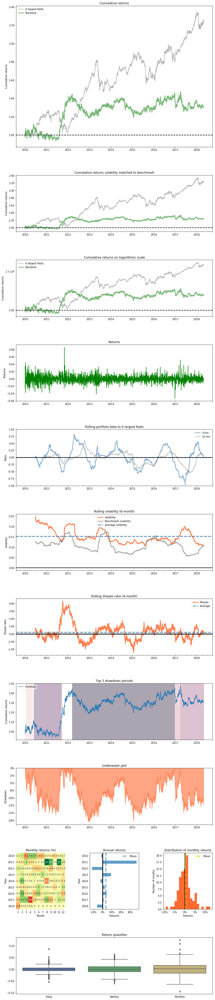

In [114]:
create_custom_tear_sheet(returns=returns, benchmark_rets=new_index_raw)